In [1]:
import gym
import gym_traj
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from tqdm import tqdm

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F

# Pretraining

In [6]:
def circle(t):
    r = 0.4
    x = r*sin(-0.02*t)
    y = r*cos(-0.02*t)+0.9
    vx = r*0.02*cos(-0.02*t)
    vy = -r*0.02*sin(-0.02*t)
    return [x, y, vx, vy]

def Lyapunov_control(x, y, vx, vy, wanted_x, wanted_y, wanted_vx, wanted_vy, param):
    """
    param["k1"], param["k2"]: linear coefs
    """
    k1, k2 = param["k1"], param["k2"]
    ax = -k1*(x - wanted_x)-k2*(vx + wanted_vx)
    ay = -k1*(y - wanted_y)-k2*(vy + wanted_vy)
    return [ax, ay]

MAX_ACC = 0.36538
def motionL(t, listState, trajectory, control, control_param):
    [x, y, vx, vy] = listState;

    if (x < -0.82)and(vx < 0):
        vx = 0
    if (x > 0.82)and(vx > 0):
        vx = 0    
    if (y < 0)and(vy < 0):
        vy = 0
    if (y > 1.61)and(vy > 0):
        vy = 0
    
    wanted_x, wanted_y, wanted_vx, wanted_vy = trajectory(t)
    index_arr = control(x, y, vx, vy, wanted_x, wanted_y, wanted_vx, wanted_vy, param = control_param)
    ind = np.argmax(index_arr)
    ax0, ay0 = action_set[ind]
    
    u = st_X(x,y)
    v = st_Y(x,y)
    
    if ax0**2 + ay0**2 > MAX_ACC*2:
        [ax, ay] = [MAX_ACC*ax0/sqrt(ax0**2 + ay0**2)+u, MAX_ACC*ay0/sqrt(ax0**2 + ay0**2)+v]
    else:
        [ax, ay] = [ax0+u, ay0+v]
#     if ax0**2 + ay0**2 > MAX_ACC*2:
#         [ax, ay] = [MAX_ACC*ax0/sqrt(ax0**2 + ay0**2), MAX_ACC*ay0/sqrt(ax0**2 + ay0**2)]
#     else:
#         [ax, ay] = [ax0, ay0]
        
    return array([vx, vy, ax, ay]), array([ax0, ay0])

MAX_ACC = 0.36538
def motion(t, listState, trajectory, control, control_param):
    [x, y, vx, vy] = listState;

    if (x < -0.82)and(vx < 0):
        vx = 0
    if (x > 0.82)and(vx > 0):
        vx = 0    
    if (y < 0)and(vy < 0):
        vy = 0
    if (y > 1.61)and(vy > 0):
        vy = 0
    
    wanted_x, wanted_y, wanted_vx, wanted_vy = trajectory(t)
    ax0, ay0 = control(x, y, vx, vy, wanted_x, wanted_y, wanted_vx, wanted_vy, param = control_param)
    
    u = st_X(x,y)
    v = st_Y(x,y)
    
    if ax0**2 + ay0**2 > MAX_ACC*2:
        [ax, ay] = [MAX_ACC*ax0/sqrt(ax0**2 + ay0**2)+u, MAX_ACC*ay0/sqrt(ax0**2 + ay0**2)+v]
    else:
        [ax, ay] = [ax0+u, ay0+v]
        
    return array([vx, vy, ax, ay]), array([ax0, ay0])

def motion_without_perp(t , listState, trajectory, control, control_param):
    [x, y, vx, vy] = listState;

    if (x < -0.82)and(vx < 0):
        vx = 0
    if (x > 0.82)and(vx > 0):
        vx = 0    
    if (y < 0)and(vy < 0):
        vy = 0
    if (y > 1.61)and(vy > 0):
        vy = 0
    
    wanted_x, wanted_y, wanted_vx, wanted_vy = trajectory(t)
    ax0, ay0 = control(x, y, vx, vy, wanted_x, wanted_y, wanted_vx, wanted_vy, param = control_param)
    
    u = 0
    v = 0
    
    if ax0**2 + ay0**2 > 0.36538**2:
        [ax, ay] = [0.36538*ax0/sqrt(ax0**2 + ay0**2)+u, 0.36538*ay0/sqrt(ax0**2 + ay0**2)+v]
    else:
        [ax, ay] = [ax0+u, ay0+v]
        
    return array([vx, vy, ax, ay]), array([ax0, ay0])

def ode4(ode, tspan, y0, k, trajectory, control, control_param):
    [t0, tf] = tspan
    h=(tf-t0)/k
    T = linspace(t0,tf,num = k+1, dtype = np.double)
    nrowsT = len(T)
    nrowsy0 = len(y0)
    Y = zeros((nrowsT,nrowsy0),dtype = np.double)
    acc = zeros((nrowsT, 2))
    
    Y[0][:] = y0[:]
    for i in range(1,nrowsT,1):
        t  = T[i-1]
        y  = Y[i-1][:]
        h  = T[i] - T[i-1]
        k1, acc[i-1, :] = ode(t,y,trajectory,control, control_param)
        k2, _ = ode(t+0.5*h,y+0.5*h*k1,trajectory,control, control_param)
        k3, _ = ode(t+h/2.0,y+0.5*h*k2,trajectory,control, control_param)
        k4, _ = ode(t+h,y+h*k3,trajectory,control, control_param)
        yn = y+(1.0/6.0)*h*(k1+2.0*k2+2.0*k3+k4)
        Y[i][:] = yn
    return [T, Y, acc]

def deep_control(*state, param):
    """
    param["model"]: trained neural net
    param["var"]: variance of normal noize with shape (2,)
    do not define this keyword if you want to get unnoized result
    """
    state_t = FloatTensor(np.array(state)).view(1, -1)
    res = param["model"](state_t)
    res = res.cpu().data.numpy()[0]
    if "var" in param.keys():
        res += np.random.normal(scale = param["var"], size = 2)
    elif "add" in param.keys():
        res += next(param["add"])
    return res

def st_X(x,y):
    p00 =    -0.01311
    p10 =    0.009422 
    p01 =     -0.0276
    p20 =      0.1476
    p11 =    -0.04613
    p02 =      0.2377
    p30 =     -0.1103
    p21 =     -0.2451
    p12 =      0.1946
    p03 =     -0.4666
    p40 =     -0.1914
    p31 =     0.06507
    p22 =      0.4069
    p13 =     -0.2008
    p04 =      0.3505
    p50 =     0.07237
    p41 =     0.04237
    p32 =    -0.01276
    p23 =     -0.1806
    p14 =     0.05798
    p05 =    -0.09046
    return p00 + p10*x + p01*y + p20*x**2 + p11*x*y + p02*y**2 + p30*x**3 + p21*x**2*y + p12*x*y**2 + p03*y**3 + p40*x**4 + p31*x**3*y + p22*x**2*y**2 + p13*x*y**3 + p04*y**4 + p50*x**5 + p41*x**4*y + p32*x**3*y**2 + p23*x**2*y**3 + p14*x*y**4 + p05*y**5

def st_Y(x,y):
    p00 =     0.04728
    p10 =    -0.03281
    p01 =     -0.4472
    p20 =    -0.09362
    p11 =       0.397
    p02 =       1.532
    p30 =    -0.02768
    p21 =      0.4174
    p12 =      -1.004
    p03 =      -2.566
    p40 =     0.06433
    p31 =      0.1234
    p22 =     -0.5461
    p13 =      0.8732
    p04 =       1.959
    p50 =    0.001958
    p41 =    -0.06374
    p32 =    -0.09306  
    p23 =      0.2182
    p14 =     -0.2402
    p05 =     -0.5396
    return p00 + p10*x + p01*y + p20*x**2 + p11*x*y + p02*y**2 + p30*x**3 + p21*x**2*y + p12*x*y**2 + p03*y**3 + p40*x**4 + p31*x**3*y + p22*x**2*y**2 + p13*x*y**3 + p04*y**4 + p50*x**5 + p41*x**4*y + p32*x**3*y**2 + p23*x**2*y**3 + p14*x*y**4 + p05*y**5



In [7]:
# mina = -0.002
# maxa = 0.002

# action_side = 100
# arr = np.linspace(mina, maxa, action_side)
# action_set = np.zeros((action_side**2, 2))
# for i in range(action_side):
#     for j in range(action_side):
#         action_set[i*action_side + j, 0] = arr[i]
#         action_set[i*action_side + j, 1] = arr[j]  


In [8]:
from math import sqrt,sin,cos
from numpy import array
from numpy import linspace,zeros,float64
import numpy as np

# env = gym.make('Traj-v0')
# env.reset()
# n_actions = env.action_space.n
# # plt.imshow(env.render("rgb_array"))
# env.close()

In [9]:
if torch.cuda.is_available():
    use_gpu = True
    print("Using GPU")
else:
    use_gpu = False
FloatTensor = torch.cuda.FloatTensor if use_gpu else torch.FloatTensor
DoubleTensor = torch.cuda.DoubleTensor if use_gpu else torch.DoubleTensor
LongTensor = torch.cuda.LongTensor if use_gpu else torch.LongTensor
ByteTensor = torch.cuda.ByteTensor if use_gpu else torch.ByteTensor
Tensor = DoubleTensor

In [10]:
model = nn.Sequential(
        nn.Linear(8, 32),
        nn.ReLU(),
    
        nn.Linear(32, 32),
        nn.Sigmoid(),
    
        nn.Linear(32, 2),
).type(FloatTensor)

if use_gpu:
    model.cuda()

In [11]:
def loss_pretrain(target, predicted):
    return ((target - predicted)**2).sum()

In [12]:
DotQuan = 1800
Time = 900

tm = [0, Time]
y0 = array([-0.5, 1.2, 0.0, 0.0])
K = {"k1": 0.12, "k2": 0.68}

K = {"k1": 0.12, "k2": 0.68}
def get_batches_pretrain(trajectory, batch_size, batch_num):
    for n_batch in range(batch_num):
        inp = np.random.rand(batch_size, 8)*1.6 - np.array([0.8, 0, 0.8, 0.8, 0.8, 0, 0.8, 0.8])
        out = np.array([Lyapunov_control(*x, K) for x in inp])
        
        if use_gpu:
            inp, out = FloatTensor(inp).cuda(), FloatTensor(out).cuda()
        else:
            inp, out = FloatTensor(inp), FloatTensor(out)
        yield inp, out

In [13]:
n_epochs = 60
batch_size = 32
batch_num = 1
opt = torch.optim.Adam(model.parameters(), 2e-4)

def pretraining(model, optimizer, n_epochs = n_epochs, batch_size = batch_size, batch_num = batch_num):
    model.train(True)
    for epoch in tqdm(range(n_epochs)):
        for x, y in get_batches_pretrain(circle, batch_size, batch_num):
            optimizer.zero_grad()
            y_pred = model(x)
            loss = loss_pretrain(y, y_pred)
            loss.backward()
            optimizer.step()
    return model 

In [14]:
pretrained_model = pretraining(model, opt, 5000, 256, 5);

100%|██████████| 5000/5000 [01:00<00:00, 71.88it/s] 


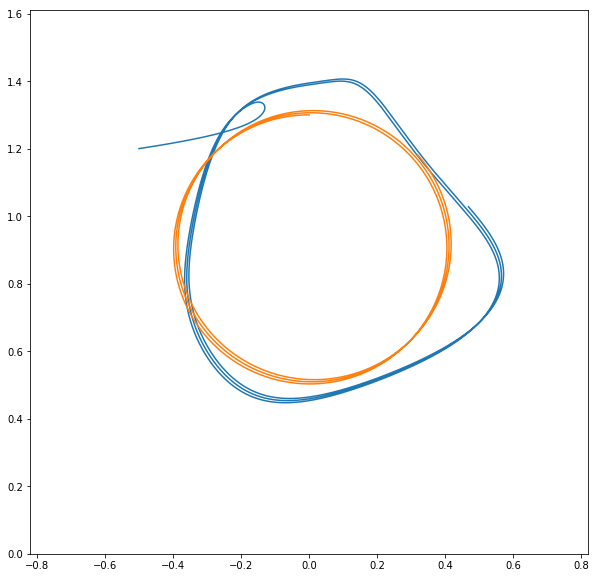

In [15]:
yid = np.array([circle(t) for t in np.linspace(0, Time, DotQuan+1)])

pretrained_model.eval()
[T, y_pre, ACCC] = ode4(motion,tm,y0,DotQuan,circle, deep_control, {"model": pretrained_model});
plt.figure(figsize = (10, 10))

ns1 = np.random.randn(1801)*0.00001
ns2 = np.sin(np.arange(1801)*0.00001)

plt.plot(y_pre[:,0]+ns2, y_pre[:,1]+ns2)
plt.plot(yid[:, 0]+ns2, yid[:, 1]+ns2)
plt.xlim((-0.82, 0.82))
plt.ylim((0, 1.61))
plt.show()

# Discrete pretrain

In [16]:
from IPython import display

In [17]:
model_discrete = nn.Sequential(
        nn.Linear(8, 128, bias=True),

        nn.ReLU(inplace=True),
#         nn.Sigmoid(),
        nn.Linear(128, 512, bias=True),
#         nn.BatchNorm1d(128),
#         nn.ReLU(inplace=True),
        nn.Sigmoid(),
        
        nn.Linear(512, len(ACCC)),
#         nn.Softmax()
).type(FloatTensor)
action_set = ACCC

In [18]:
def loss_pretrain(target, predicted):
#     return ((target - predicted)**2).sum() 
    
    return ((target - F.softmax(predicted))**2).sum() 
    
#     return F.cross_entropy(predicted, torch.max(target, 1)[1]) #очень плохо на краях!!!

In [19]:
DotQuan = 1800
Time = 900

tm = [0, Time]
y0 = array([-0.5, 1.2, 0.0, 0.0])
K = {"k1": 0.12, "k2": 0.68}

def batches_out(*x, K):
    ax_ay = [Lyapunov_control(*x, K)]
    aarr = np.tile(ax_ay, (action_set.shape[0], 1))
#     a_diff = np.linalg.norm((action_set - aarr), axis=0)
    a_diff = np.sum((action_set - aarr)**2, axis = 1)
    ind = np.argmin(a_diff)
    one_hot_out = np.zeros(action_set.shape[0])#[0]*action_set.shape[0]
    one_hot_out[ind] = 1
    return one_hot_out
K = {"k1": 0.12, "k2": 0.68}
def get_batches_pretrain_discrete(trajectory, batch_size, batch_num):
    for n_batch in range(batch_num):
        inp = np.zeros((batch_size, 8))
        inp[:,:2] = np.random.rand(batch_size, 2)*1.6 - np.array([0.8, 0])
        inp[:,2:4] = np.random.normal(scale = 0.001, size = (batch_size, 2))
        inp[:,4:6] = inp[:,:2] + np.random.normal(scale = 0.20, size = (batch_size, 2))
        inp[:,6:8] = np.random.normal(scale = 0.001, size = (batch_size, 2))

#         inp[:,6:8] = inp[:,2:4] + np.random.normal(scale = 0.0004, size = (batch_size, 2))
        
        
        out = np.array([batches_out(*x, K=K) for x in inp])
        
        if use_gpu:
            inp, out = FloatTensor(inp).cuda(), FloatTensor(out).cuda()
        else:
            inp, out = FloatTensor(inp), FloatTensor(out)
        yield inp, out

In [24]:
n_epochs = 50
batch_size = 64
batch_num = 10
opt = torch.optim.Adam(model_discrete.parameters(), 1e-4)
history = []
def pretraining_disc(model, optimizer, n_epochs = n_epochs, batch_size = batch_size, batch_num = batch_num):
    
    for epoch in tqdm(range(n_epochs)):
        model.train(True)
        for x, y in get_batches_pretrain_discrete(circle, batch_size, batch_num):
            optimizer.zero_grad()
            y_pred = model(x)
            
            loss = loss_pretrain(y, y_pred)
            loss.backward()
            optimizer.step()
            history.append(loss.detach().numpy())
        model.eval()
        
        if (epoch % 25 == 0):
            display.clear_output(wait = True)
            [T, y, _] = ode4(motionL,tm,y0,DotQuan,circle, deep_control, {"model": model});
            plt.figure(figsize = (10, 10))

            plt.plot(y[:,0], y[:,1])
            plt.plot(yid[:, 0], yid[:, 1])
            # plt.xlim((-0.82, 0.82))
            # plt.ylim((0, 1.61))
            plt.show()
            plt.plot(history)
            plt.show()
    return model 

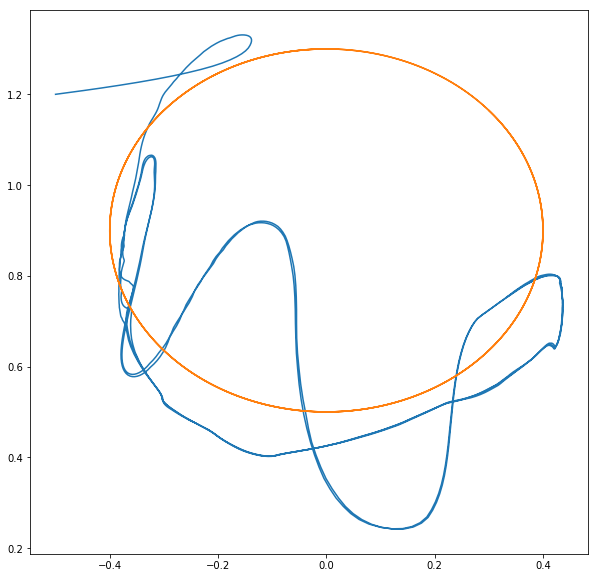

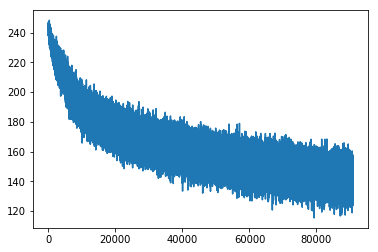



100%|██████████| 251/251 [10:46<00:00,  3.40s/it]

In [32]:
bs = 256
# opt = torch.optim.Adam(pmd.parameters(), 1e-4)
pretrained_model_disc = pretraining_disc(model_discrete, opt, 251, bs, 30);

In [29]:
PATH = './pretrained_model_disc'
torch.save(pretrained_model_disc.state_dict(), PATH)

pmd = nn.Sequential(
        nn.Linear(8, 128, bias=True),
#         nn.BatchNorm1d(128),
        nn.ReLU(inplace=True),
#         nn.Sigmoid(),
        nn.Linear(128, 512, bias=True),
#         nn.BatchNorm1d(128),
#         nn.ReLU(inplace=True),
        nn.Sigmoid(),
        
        nn.Linear(512, len(ACCC)),
#         nn.Softmax()
).type(FloatTensor)
pmd.load_state_dict(torch.load(PATH))
pmd.eval()

Sequential(
  (0): Linear(in_features=8, out_features=128, bias=True)
  (1): ReLU(inplace)
  (2): Linear(in_features=128, out_features=512, bias=True)
  (3): Sigmoid()
  (4): Linear(in_features=512, out_features=1801, bias=True)
)

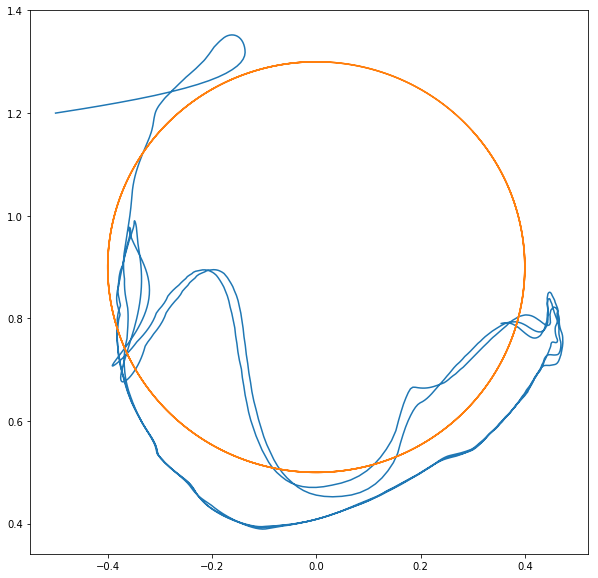

[[-5.00000000e-01  1.20000000e+00  0.00000000e+00  0.00000000e+00]
 [-4.92884656e-01  1.20111721e+00  2.66158498e-02  4.18899206e-03]
 [-4.74142720e-01  1.20409412e+00  4.68840206e-02  7.51528643e-03]
 ...
 [ 3.61171644e-01  7.91378837e-01 -5.48851913e-03 -8.95659868e-04]
 [ 3.58042888e-01  7.90906585e-01 -5.68594257e-03 -1.52512237e-03]
 [ 3.54793918e-01  7.90121950e-01 -5.96993002e-03 -2.14426004e-03]]


In [30]:
yid = np.array([circle(t) for t in np.linspace(0, Time, DotQuan+1)])

# pretrained_model_disc.eval()
[T, y_pre, _] = ode4(motionL,tm,y0,DotQuan,circle, deep_control, {"model": pmd});
plt.figure(figsize = (10, 10))

plt.plot(y_pre[:,0], y_pre[:,1])
plt.plot(yid[:, 0], yid[:, 1])
# plt.xlim((-0.82, 0.82))
# plt.ylim((0, 1.61))
plt.show()

print(y_pre)

In [31]:
# PATH = './pretrained_model_disc'
# torch.save(pretrained_model_disc.state_dict(), PATH)

In [32]:
# pmd = nn.Sequential(
#         nn.Linear(8, 128, bias=True),
# #         nn.BatchNorm1d(128),
#         nn.ReLU(inplace=True),
# #         nn.Sigmoid(),
#         nn.Linear(128, 128, bias=True),
# #         nn.BatchNorm1d(128),
# #         nn.ReLU(inplace=True),
#         nn.Sigmoid(),
        
#         nn.Linear(128, len(ACCC)),
# #         nn.Softmax()
# ).type(FloatTensor)
# pmd.load_state_dict(torch.load(PATH))
# pmd.eval()

# Simple DQN

In [34]:
pmd = nn.Sequential(
        nn.Linear(8, 128, bias=True),
        nn.ReLU(inplace=True),
        nn.Linear(128, 512, bias=True),
        nn.Sigmoid(),
        nn.Linear(512, len(ACCC)),
).type(FloatTensor)
pmd.load_state_dict(torch.load(PATH))
pmd.eval()

Sequential(
  (0): Linear(in_features=8, out_features=128, bias=True)
  (1): ReLU(inplace)
  (2): Linear(in_features=128, out_features=512, bias=True)
  (3): Sigmoid()
  (4): Linear(in_features=512, out_features=1801, bias=True)
)

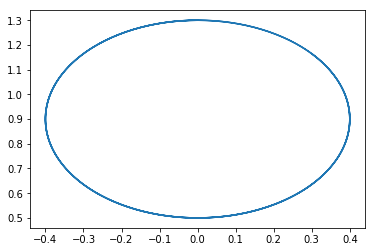

In [35]:
env = gym.make('Traj-v0')
env.action_set = ACCC
env.reset()
n_actions = env.action_space.n
# plt.imshow(env.render("rgb_array"))
env.close()

In [36]:
import copy


network = pmd

In [37]:
def get_action(state, epsilon=0):
    """
    sample actions with epsilon-greedy policy
    recap: with p = epsilon pick random action, else pick action with highest Q(s,a)
    """
    state = torch.tensor(state[None], dtype=torch.float32)
    q_values = network(state).detach().numpy()

    if np.random.rand() < epsilon:
        return int(np.random.choice((q_values).shape[1]))
    else:
        return int(np.argmax(q_values))

In [39]:
def to_one_hot(y_tensor, n_dims=None):
    y_tensor = y_tensor.type(torch.LongTensor).view(-1, 1)
    n_dims = n_dims if n_dims is not None else int(torch.max(y_tensor)) + 1
    y_one_hot = torch.zeros(
        y_tensor.size()[0], n_dims).scatter_(1, y_tensor, 1)
    return y_one_hot


def where(cond, x_1, x_2):
    """ like np.where  """
    return (cond * x_1) + ((1-cond) * x_2)

In [40]:
def compute_td_loss(states, actions, rewards, next_states, is_done, gamma=0.99, check_shapes=False):
    """ Compute td loss using torch operations only. Use the formula above. """
    states = torch.tensor(states, dtype=torch.float32)    # shape: [batch_size, state_size]
    actions = torch.tensor(actions, dtype=torch.int32)    # shape: [batch_size]
    rewards = torch.tensor(rewards, dtype=torch.float32)  # shape: [batch_size]
    # shape: [batch_size, state_size]
    next_states = torch.tensor(next_states, dtype=torch.float32)
    is_done = torch.tensor(is_done, dtype=torch.float32)  # shape: [batch_size]

    # get q-values for all actions in current states
    predicted_qvalues = network(states)

    # select q-values for chosen actions
    predicted_qvalues_for_actions = torch.sum(
        predicted_qvalues * to_one_hot(actions, n_actions), dim=1)

    # compute q-values for all actions in next states
    predicted_next_qvalues = network(next_states).detach()

    # compute V*(next_states) using predicted next q-values
    next_state_values = torch.max(predicted_next_qvalues, dim=1)[0]
    assert next_state_values.dtype == torch.float32

    # compute "target q-values" for loss - it's what's inside square parentheses in the above formula.
    target_qvalues_for_actions = rewards + gamma * next_state_values

    # at the last state we shall use simplified formula: Q(s,a) = r(s,a) since s' doesn't exist
    target_qvalues_for_actions = where(
        is_done, rewards, target_qvalues_for_actions)

    # mean squared error loss to minimize
    loss = torch.mean((predicted_qvalues_for_actions -
                       target_qvalues_for_actions.detach()) ** 2)

    return loss

In [42]:
opt = torch.optim.Adam(network.parameters(), lr=5e-6)
epsilon = 0.5

In [43]:
def generate_session(t_max=1801, epsilon=0, train=False):
    total_reward = 0
    env.start_state = np.concatenate((np.array([-0.5, 1.2, 0.0, 0.0]), env.true_traj[0, :]))
    s = env.reset()
    env.start_state = np.concatenate((np.array([-0.5, 1.2, 0.0, 0.0]), env.true_traj[0, :]))
    
    state_arr = [s]
    for t in range(t_max):
        a = get_action(s, epsilon=epsilon)
        env.model = network
        next_s, r, done, _ = env.step(a)
        state_arr.append(np.array(next_s))
        if train:
            opt.zero_grad()
            compute_td_loss([s], [a], [r], [next_s], [done]).backward()
            opt.step()
        
        total_reward += r
        s = next_s
        if done:
            break
    state_arr = np.array(state_arr)
    plt.plot(state_arr[:, 0], state_arr[:, 1])
    plt.scatter(env.start_state[0], env.start_state[1] )
    plt.show()
    return total_reward




  0%|          | 0/300 [00:00<?, ?it/s]

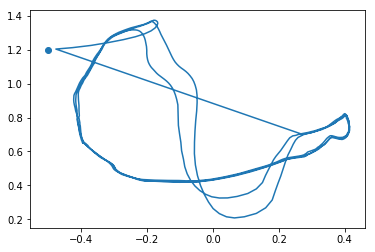

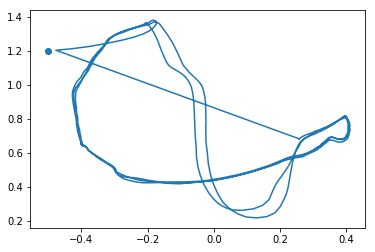

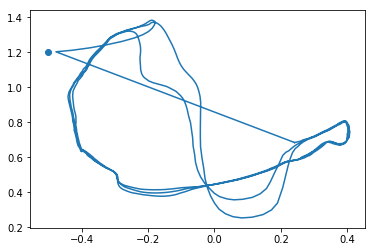




  0%|          | 1/300 [01:37<8:04:52, 97.30s/it]

epoch #0	mean reward = -59.848	epsilon = 0.495


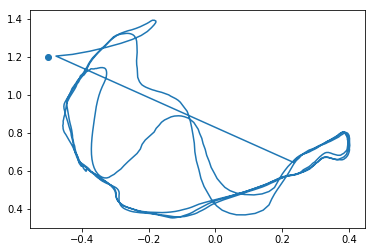

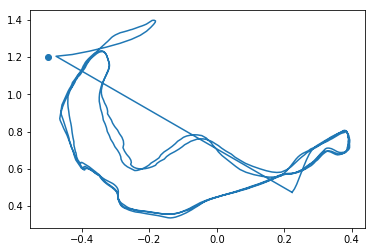

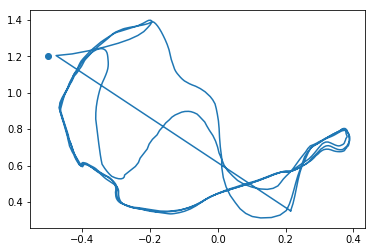




  1%|          | 2/300 [03:42<8:44:56, 105.69s/it]

epoch #1	mean reward = -73.316	epsilon = 0.490


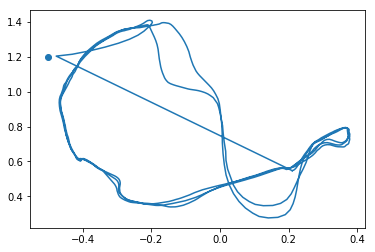

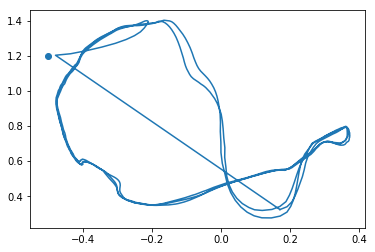

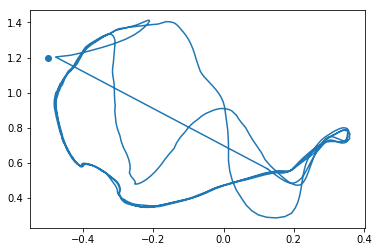




  1%|          | 3/300 [05:41<9:02:26, 109.58s/it]

epoch #2	mean reward = -64.182	epsilon = 0.485


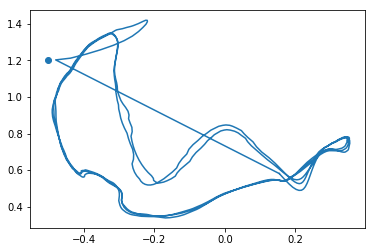

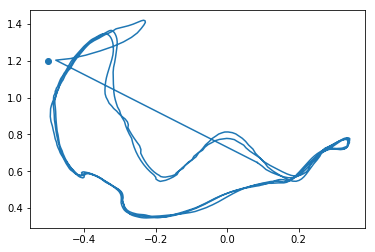

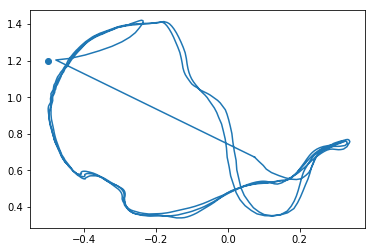




  1%|▏         | 4/300 [07:41<9:16:51, 112.88s/it]

epoch #3	mean reward = -76.416	epsilon = 0.480


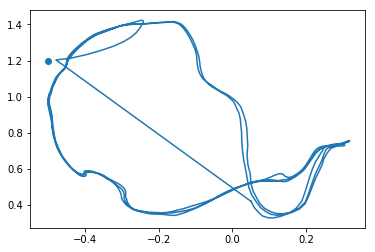

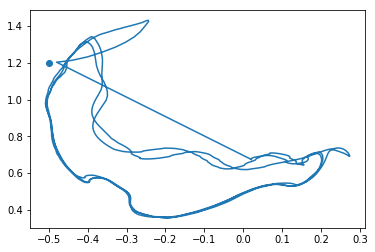

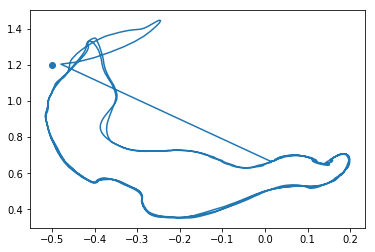




  2%|▏         | 5/300 [09:45<9:30:24, 116.02s/it]

epoch #4	mean reward = -88.487	epsilon = 0.475


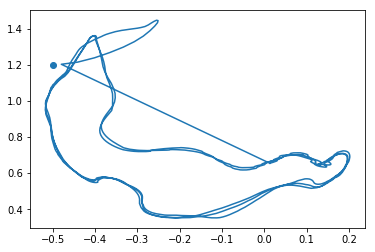

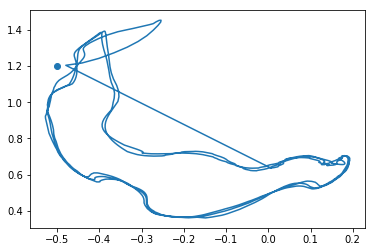

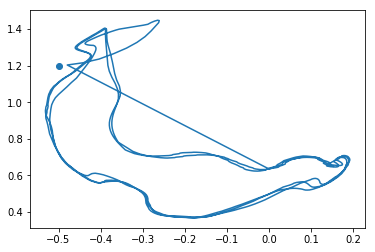




  2%|▏         | 6/300 [11:51<9:43:27, 119.07s/it]

epoch #5	mean reward = -104.809	epsilon = 0.471


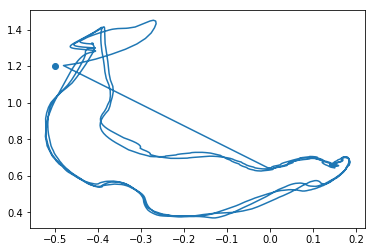

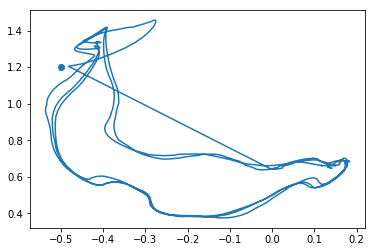

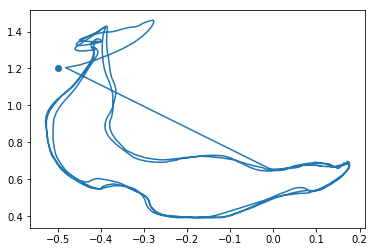




  2%|▏         | 7/300 [13:55<9:48:19, 120.48s/it]

epoch #6	mean reward = -111.775	epsilon = 0.466


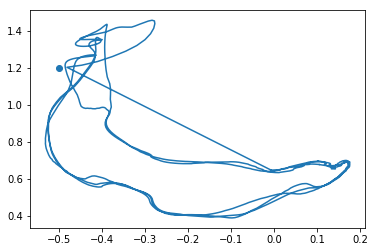

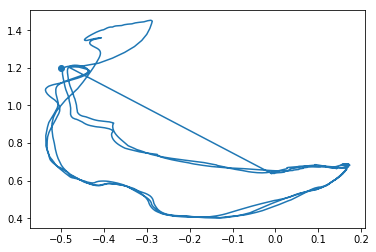

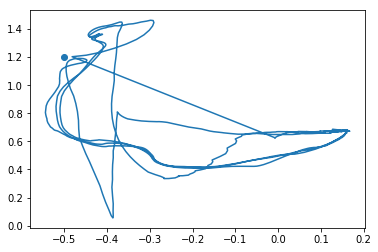




  3%|▎         | 8/300 [16:00<9:53:14, 121.90s/it]

epoch #7	mean reward = -129.793	epsilon = 0.461


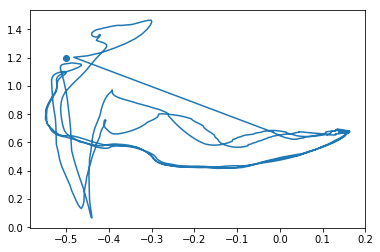

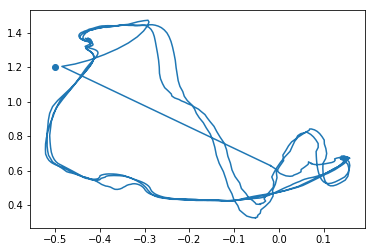

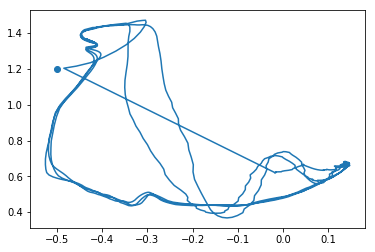




  3%|▎         | 9/300 [18:01<9:50:40, 121.79s/it]

epoch #8	mean reward = -139.409	epsilon = 0.457


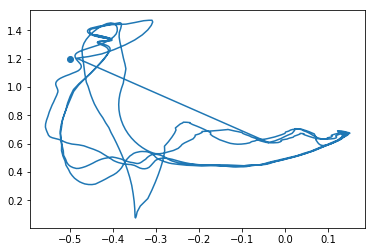

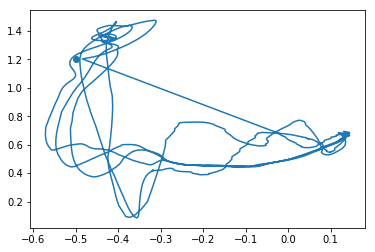

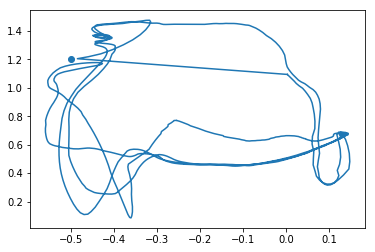




  3%|▎         | 10/300 [20:03<9:48:54, 121.84s/it]

epoch #9	mean reward = -162.491	epsilon = 0.452


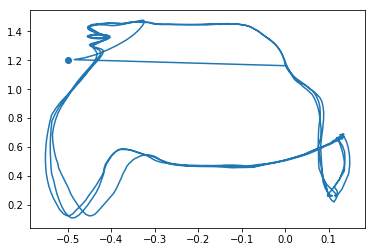

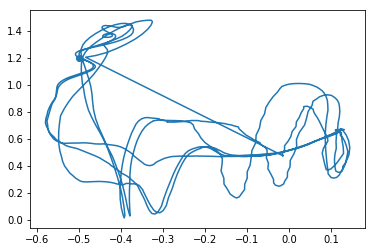

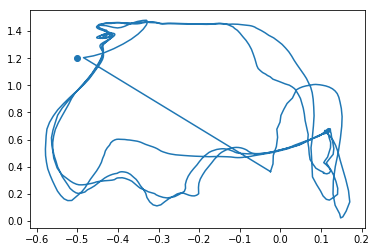




  4%|▎         | 11/300 [22:01<9:40:17, 120.48s/it]

epoch #10	mean reward = -144.537	epsilon = 0.448


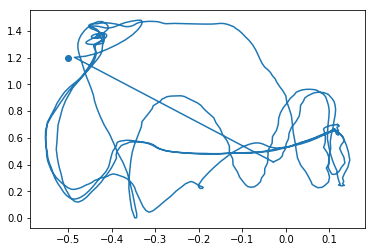

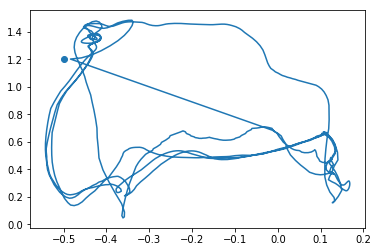

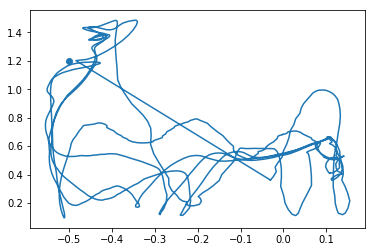




  4%|▍         | 12/300 [24:00<9:36:14, 120.05s/it]

epoch #11	mean reward = -183.690	epsilon = 0.443


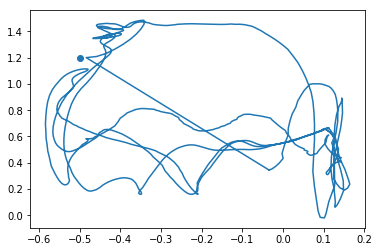

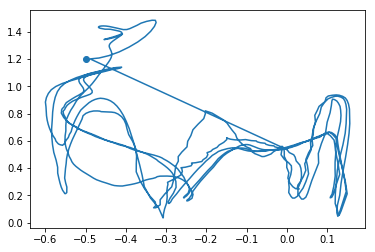

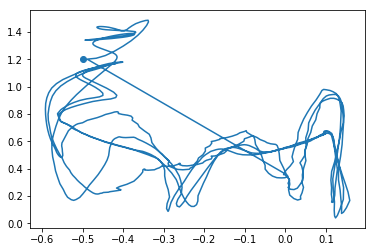




  4%|▍         | 13/300 [26:00<9:34:24, 120.08s/it]

epoch #12	mean reward = -219.024	epsilon = 0.439


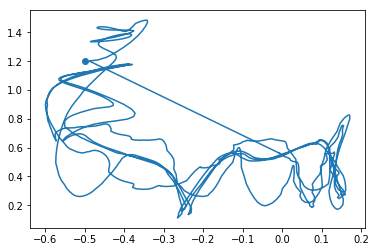

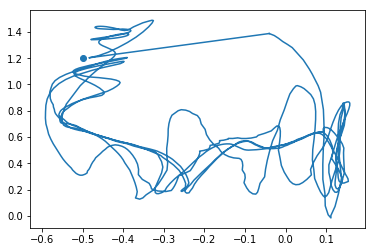

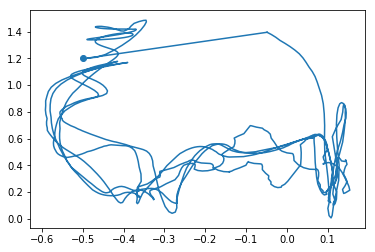




  5%|▍         | 14/300 [28:00<9:33:02, 120.22s/it]

epoch #13	mean reward = -257.425	epsilon = 0.434


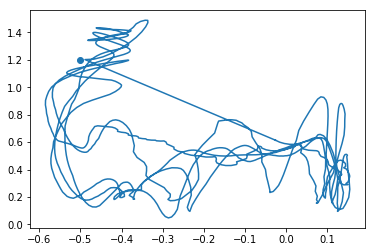

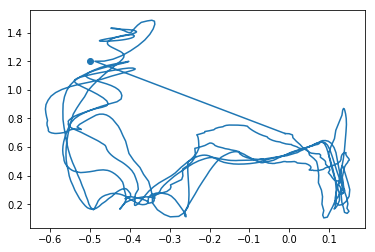

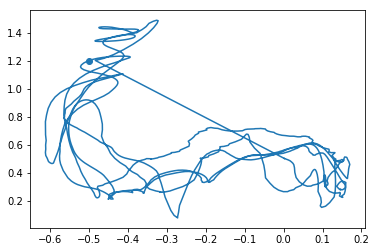




  5%|▌         | 15/300 [29:59<9:28:51, 119.76s/it]

epoch #14	mean reward = -251.729	epsilon = 0.430


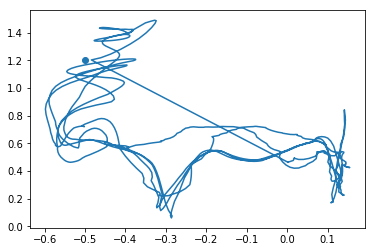

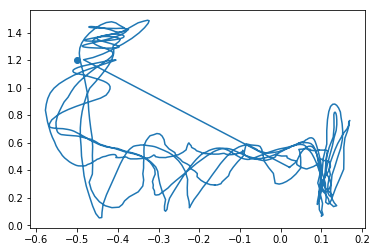

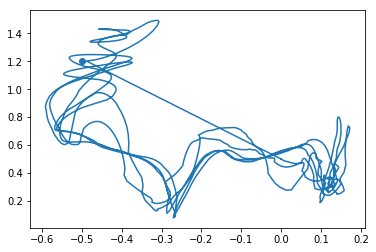




  5%|▌         | 16/300 [32:03<9:32:45, 121.00s/it]

epoch #15	mean reward = -230.379	epsilon = 0.426


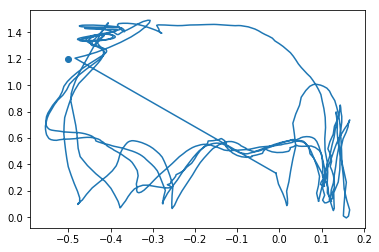

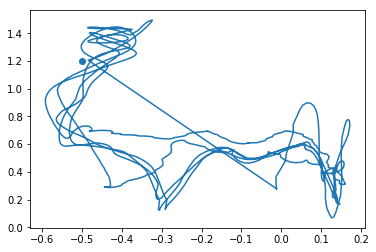

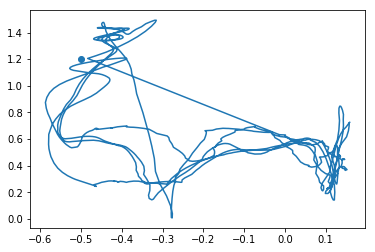




  6%|▌         | 17/300 [34:15<9:46:31, 124.35s/it]

epoch #16	mean reward = -215.223	epsilon = 0.421


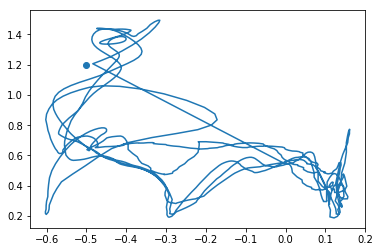

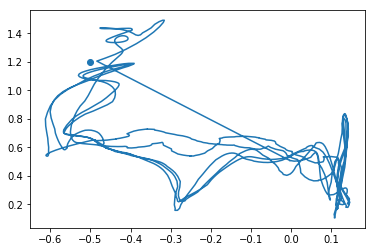

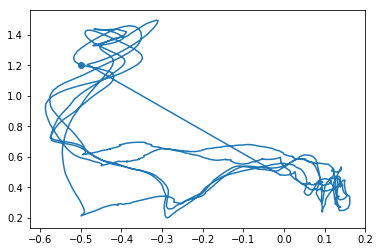




  6%|▌         | 18/300 [36:19<9:44:15, 124.31s/it]

epoch #17	mean reward = -212.119	epsilon = 0.417


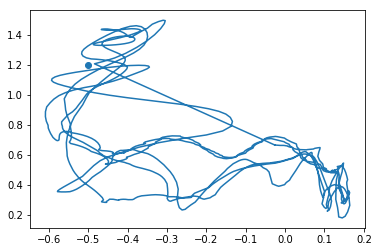

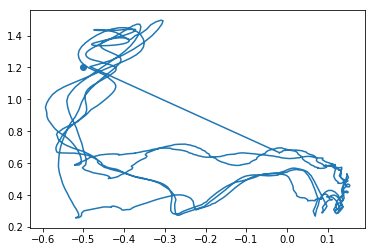

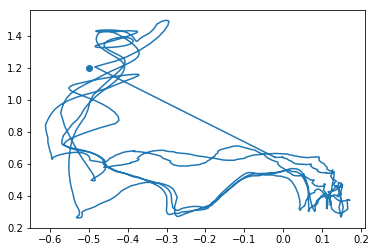




  6%|▋         | 19/300 [38:26<9:45:43, 125.06s/it]

epoch #18	mean reward = -195.420	epsilon = 0.413


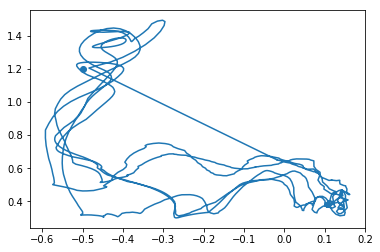

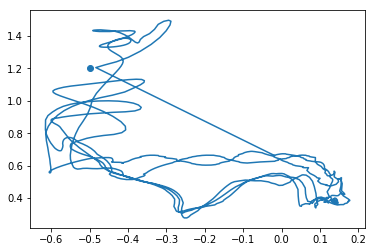

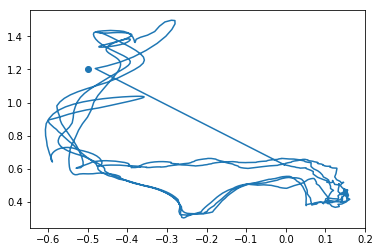




  7%|▋         | 20/300 [40:38<9:52:28, 126.96s/it]

epoch #19	mean reward = -194.242	epsilon = 0.409


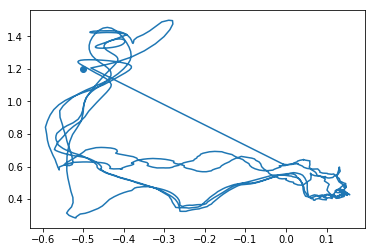

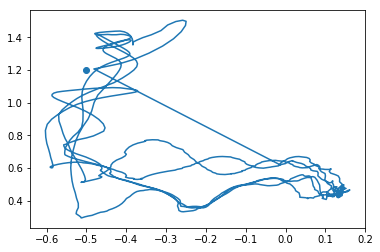

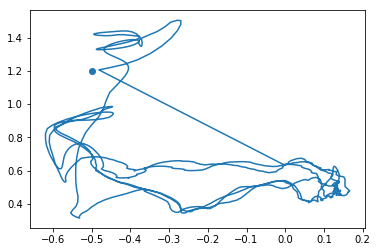




  7%|▋         | 21/300 [42:50<9:57:49, 128.56s/it]

epoch #20	mean reward = -192.266	epsilon = 0.405


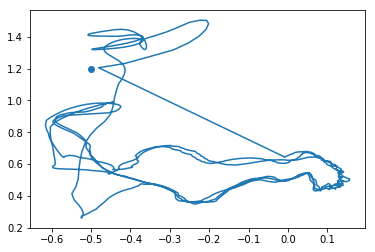

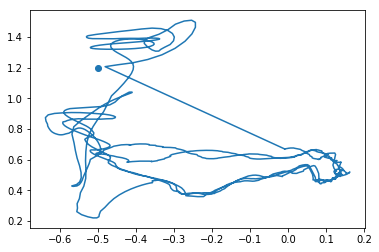

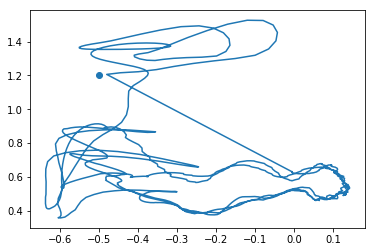




  7%|▋         | 22/300 [44:55<9:50:16, 127.40s/it]

epoch #21	mean reward = -182.317	epsilon = 0.401


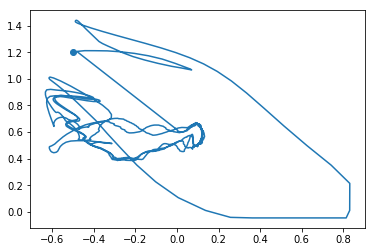

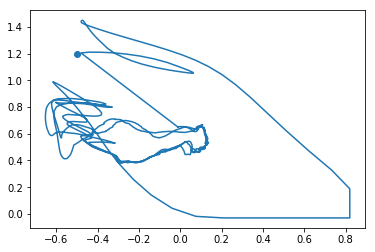

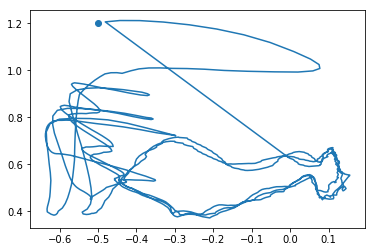




  8%|▊         | 23/300 [47:09<9:57:24, 129.40s/it]

epoch #22	mean reward = -206.814	epsilon = 0.397


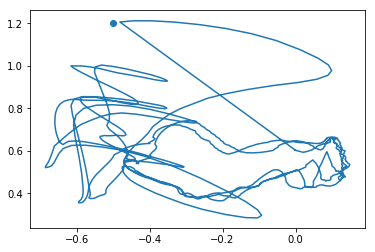

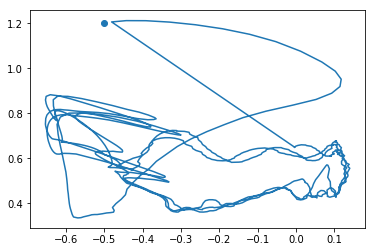

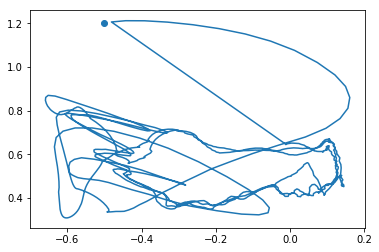




  8%|▊         | 24/300 [49:10<9:43:39, 126.88s/it]

epoch #23	mean reward = -209.448	epsilon = 0.393


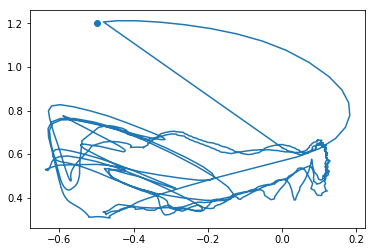

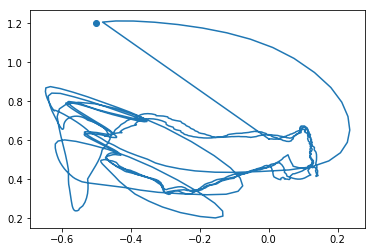

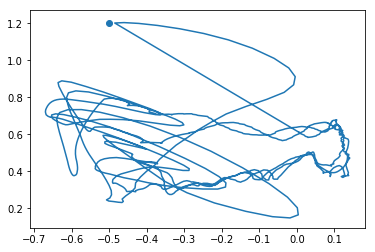




  8%|▊         | 25/300 [51:10<9:32:02, 124.81s/it]

epoch #24	mean reward = -226.614	epsilon = 0.389


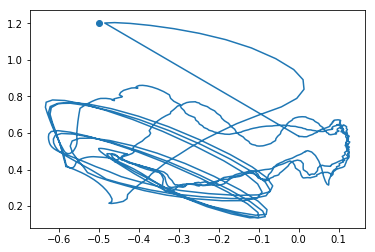

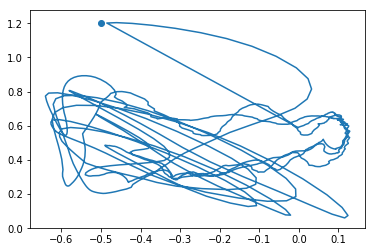

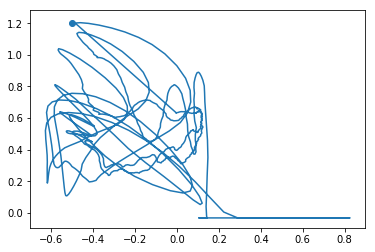




  9%|▊         | 26/300 [53:07<9:20:14, 122.68s/it]

epoch #25	mean reward = -446.469	epsilon = 0.385


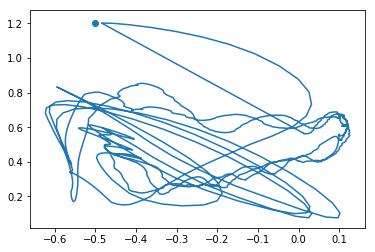

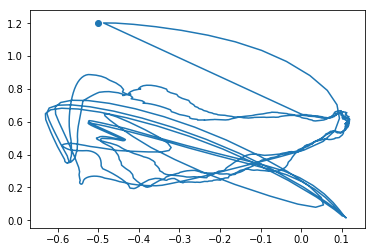

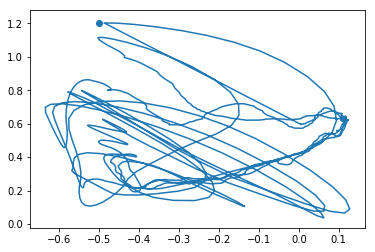




  9%|▉         | 27/300 [55:03<9:09:13, 120.71s/it]

epoch #26	mean reward = -264.519	epsilon = 0.381


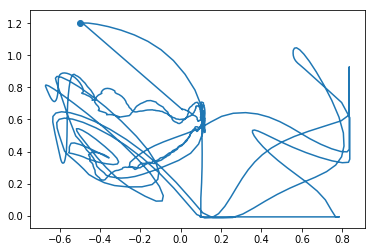

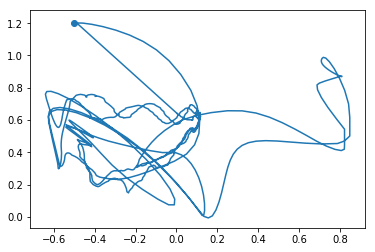

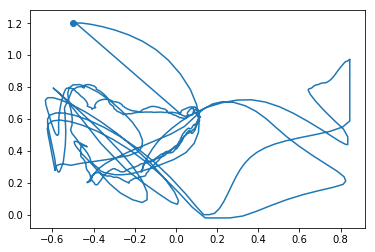




  9%|▉         | 28/300 [57:08<9:12:09, 121.80s/it]

epoch #27	mean reward = -367.912	epsilon = 0.377


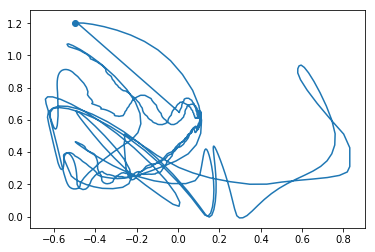

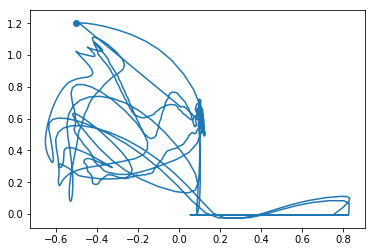

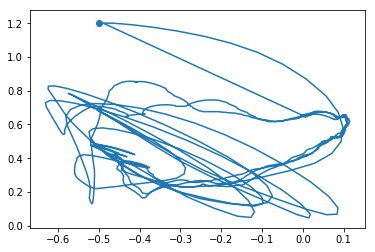




 10%|▉         | 29/300 [59:20<9:24:46, 125.04s/it]

epoch #28	mean reward = -416.725	epsilon = 0.374


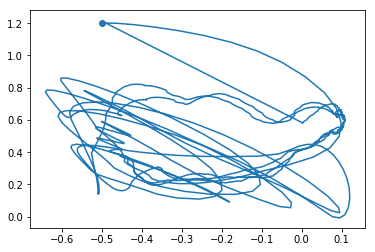

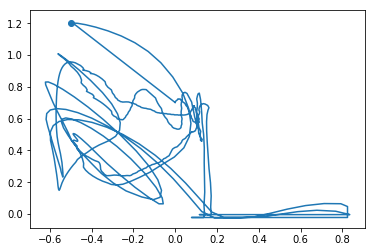

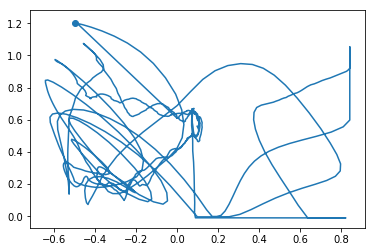




 10%|█         | 30/300 [1:01:32<9:32:02, 127.12s/it]

epoch #29	mean reward = -590.016	epsilon = 0.370


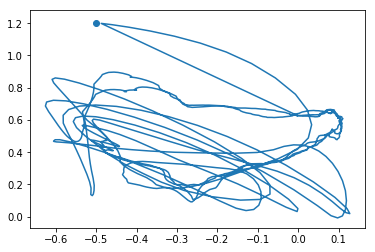

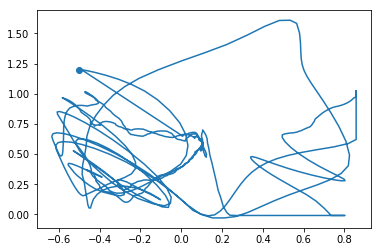

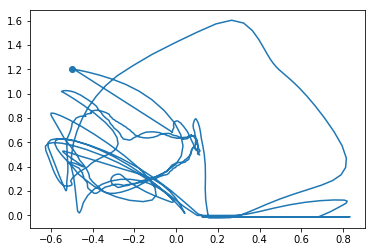




 10%|█         | 31/300 [1:03:39<9:28:55, 126.90s/it]

epoch #30	mean reward = -428.775	epsilon = 0.366


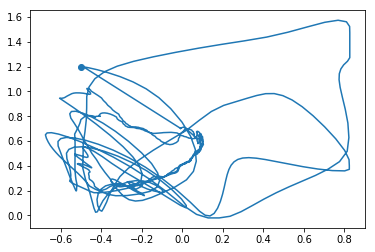

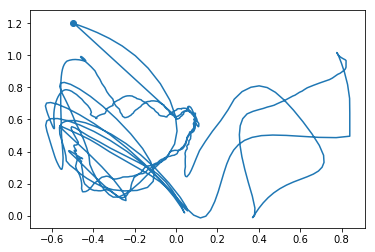

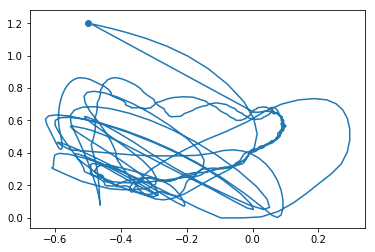




 11%|█         | 32/300 [1:05:44<9:25:01, 126.50s/it]

epoch #31	mean reward = -335.432	epsilon = 0.362


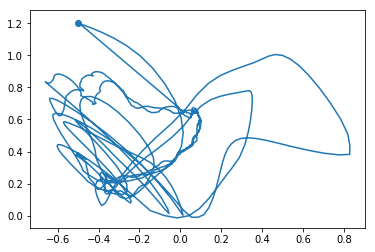

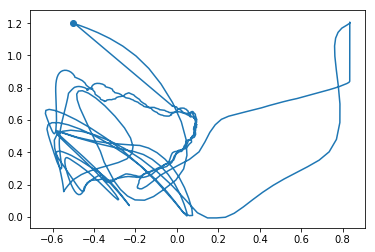

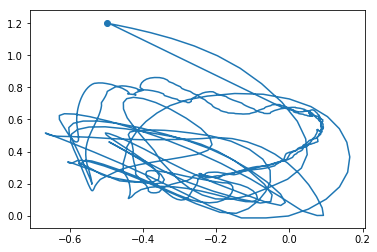




 11%|█         | 33/300 [1:07:50<9:21:58, 126.29s/it]

epoch #32	mean reward = -326.121	epsilon = 0.359


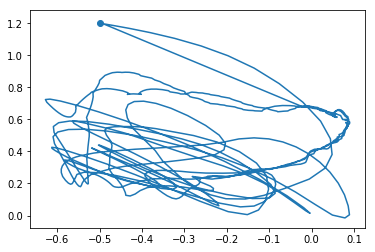

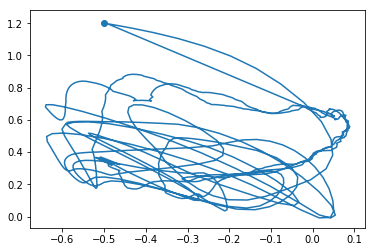

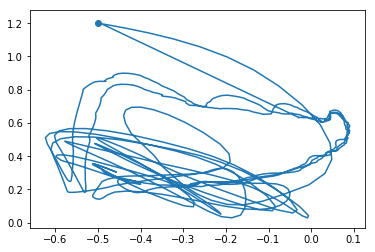




 11%|█▏        | 34/300 [1:09:55<9:18:33, 125.99s/it]

epoch #33	mean reward = -307.098	epsilon = 0.355


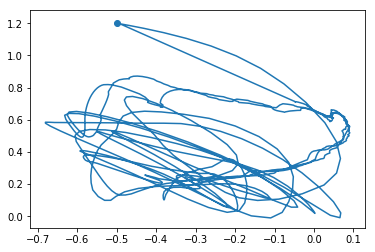

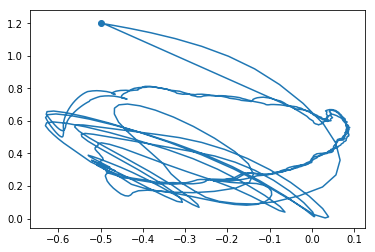

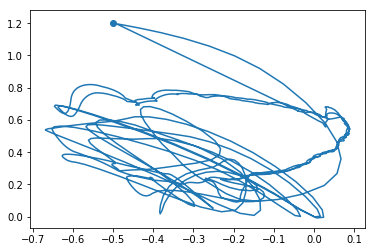




 12%|█▏        | 35/300 [1:12:03<9:18:39, 126.49s/it]

epoch #34	mean reward = -296.894	epsilon = 0.352


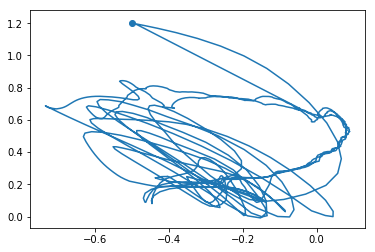

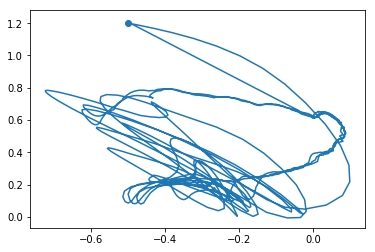

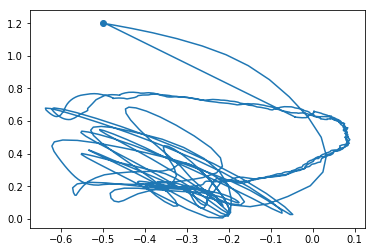




 12%|█▏        | 36/300 [1:14:10<9:16:38, 126.51s/it]

epoch #35	mean reward = -311.056	epsilon = 0.348


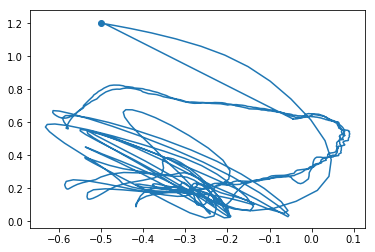

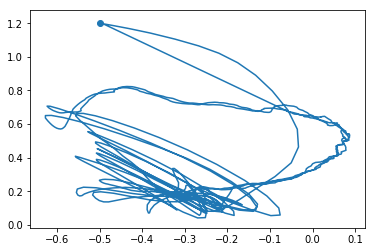

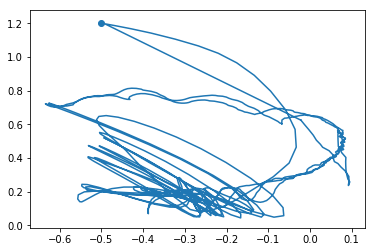




 12%|█▏        | 37/300 [1:16:16<9:14:22, 126.47s/it]

epoch #36	mean reward = -335.734	epsilon = 0.345


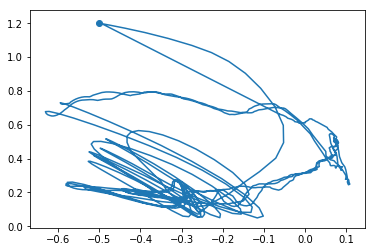

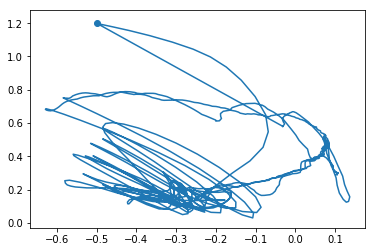

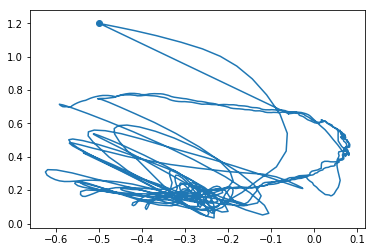




 13%|█▎        | 38/300 [1:18:21<9:10:39, 126.11s/it]

epoch #37	mean reward = -360.008	epsilon = 0.341


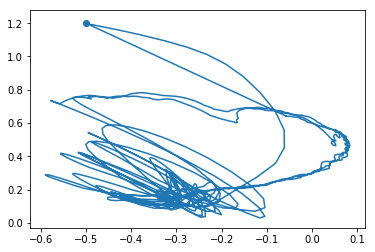

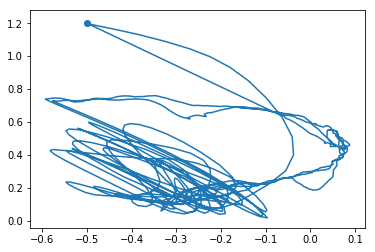

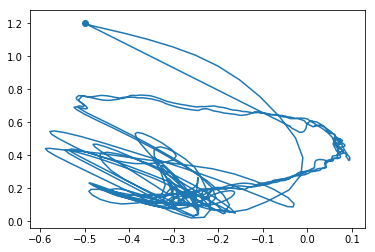




 13%|█▎        | 39/300 [1:20:28<9:09:59, 126.44s/it]

epoch #38	mean reward = -363.203	epsilon = 0.338


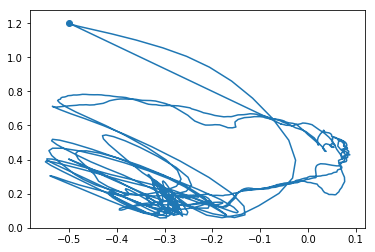

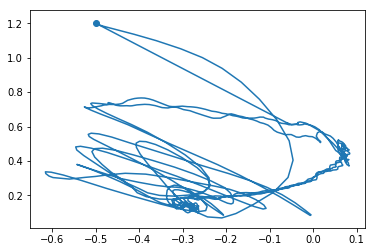

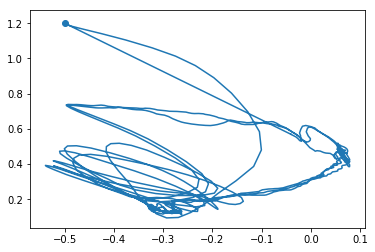




 13%|█▎        | 40/300 [1:22:35<9:07:37, 126.38s/it]

epoch #39	mean reward = -387.875	epsilon = 0.334


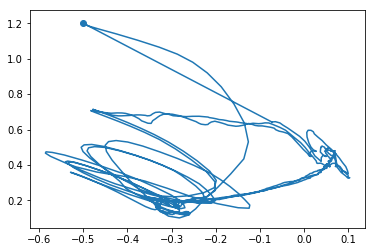

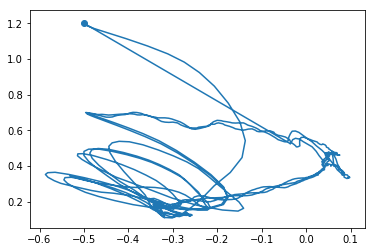

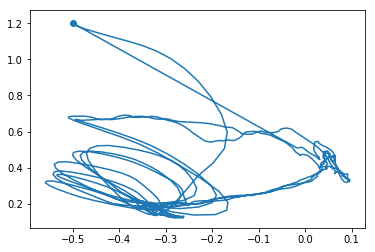




 14%|█▎        | 41/300 [1:24:51<9:18:14, 129.32s/it]

epoch #40	mean reward = -388.219	epsilon = 0.331


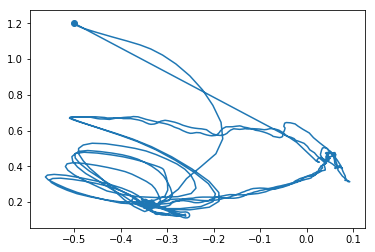

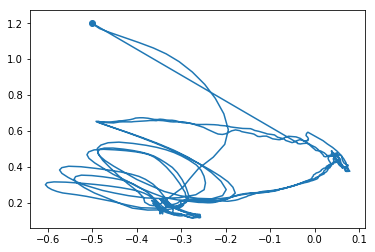

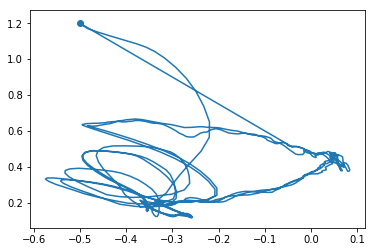




 14%|█▍        | 42/300 [1:27:02<9:18:44, 129.94s/it]

epoch #41	mean reward = -384.490	epsilon = 0.328


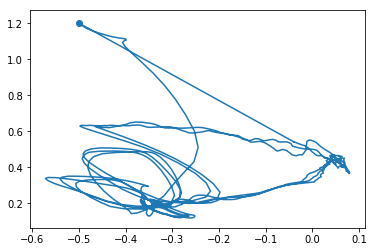

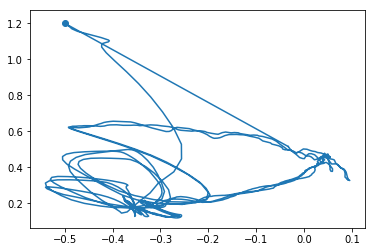

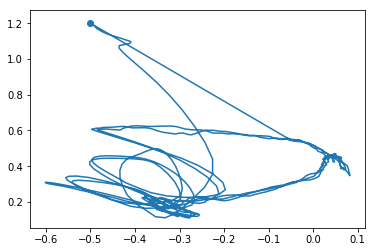




 14%|█▍        | 43/300 [1:29:14<9:18:40, 130.43s/it]

epoch #42	mean reward = -383.881	epsilon = 0.325


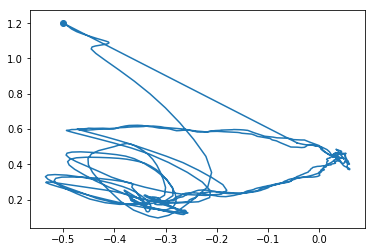

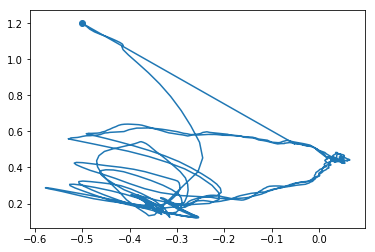

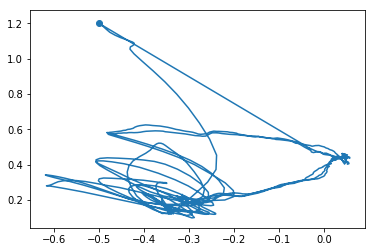




 15%|█▍        | 44/300 [1:31:37<9:32:44, 134.24s/it]

epoch #43	mean reward = -387.808	epsilon = 0.321


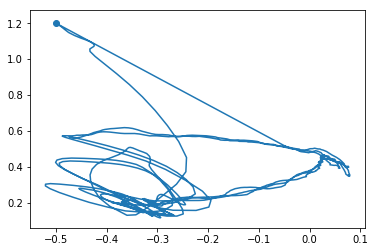

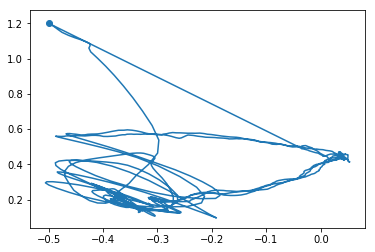

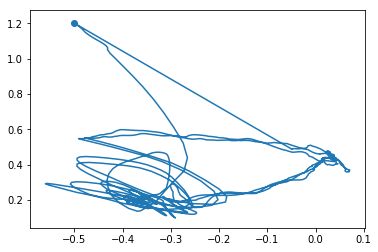




 15%|█▌        | 45/300 [1:33:54<9:33:43, 134.99s/it]

epoch #44	mean reward = -401.082	epsilon = 0.318


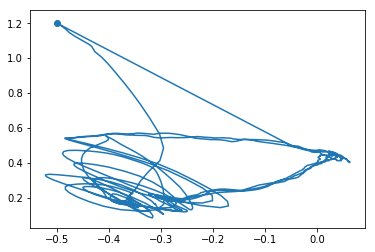

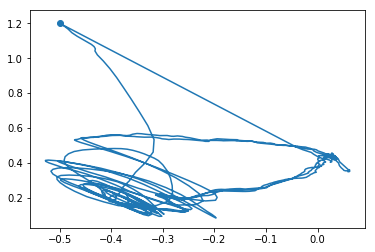

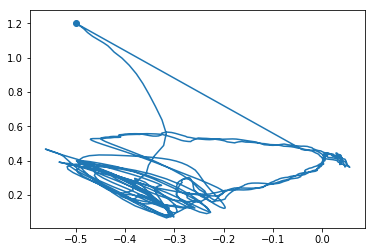




 15%|█▌        | 46/300 [1:36:03<9:24:25, 133.33s/it]

epoch #45	mean reward = -412.166	epsilon = 0.315


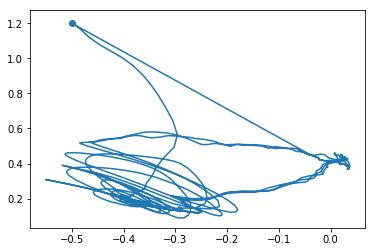

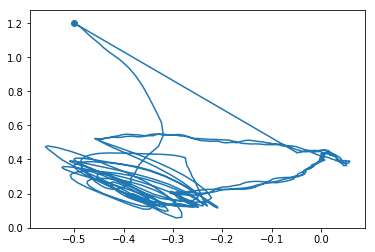

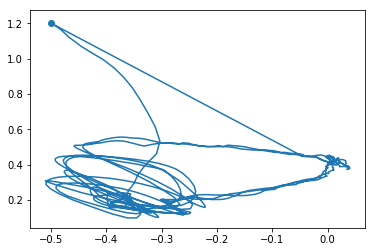




 16%|█▌        | 47/300 [1:38:17<9:23:11, 133.56s/it]

epoch #46	mean reward = -428.501	epsilon = 0.312


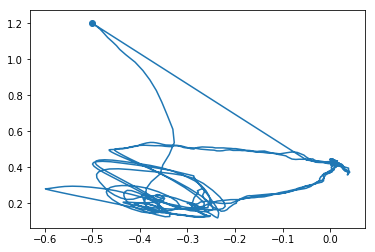

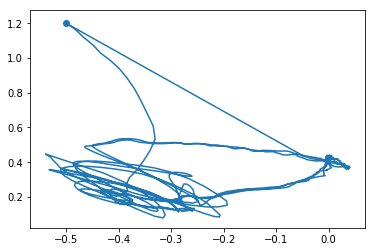

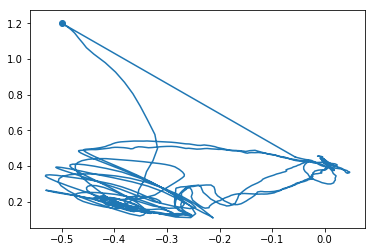




 16%|█▌        | 48/300 [1:40:30<9:19:55, 133.32s/it]

epoch #47	mean reward = -441.192	epsilon = 0.309


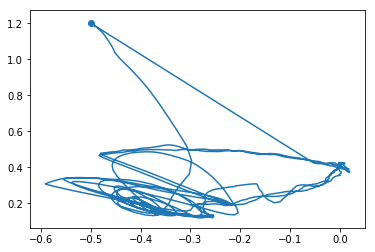

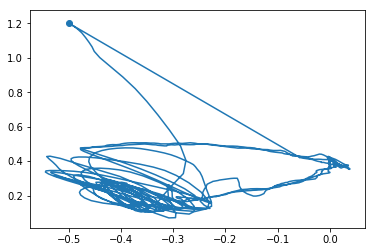

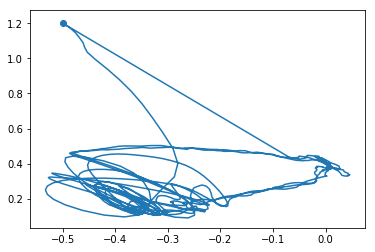




 16%|█▋        | 49/300 [1:42:39<9:12:39, 132.11s/it]

epoch #48	mean reward = -452.529	epsilon = 0.306


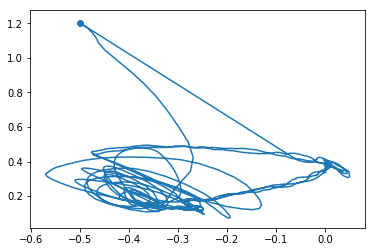

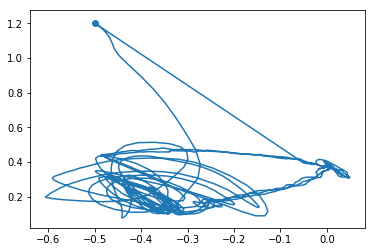

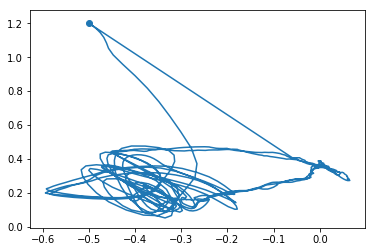




 17%|█▋        | 50/300 [1:44:59<9:19:50, 134.36s/it]

epoch #49	mean reward = -468.259	epsilon = 0.303


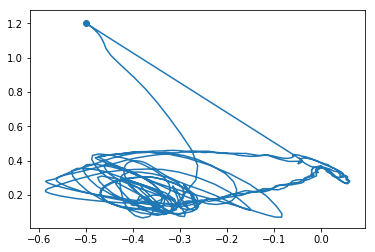

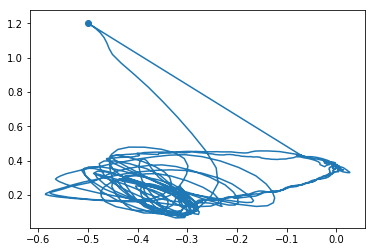

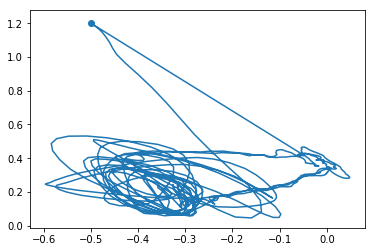




 17%|█▋        | 51/300 [1:47:13<9:17:40, 134.38s/it]

epoch #50	mean reward = -476.777	epsilon = 0.299


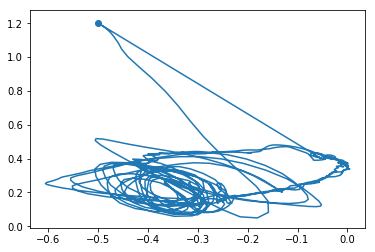

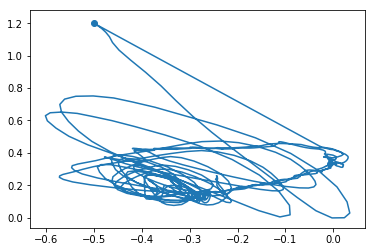

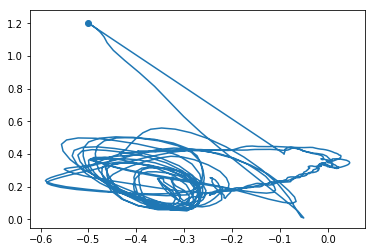




 17%|█▋        | 52/300 [1:49:39<9:29:23, 137.76s/it]

epoch #51	mean reward = -475.096	epsilon = 0.296


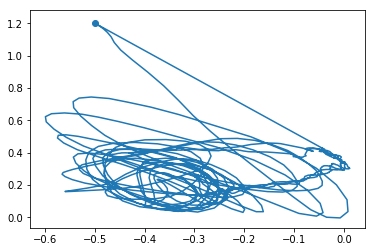

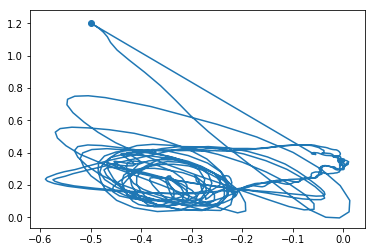

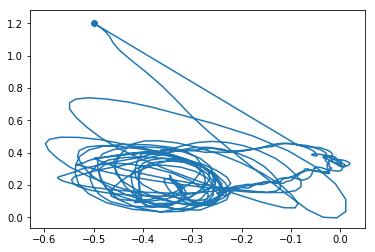




 18%|█▊        | 53/300 [1:51:56<9:26:02, 137.50s/it]

epoch #52	mean reward = -480.160	epsilon = 0.294


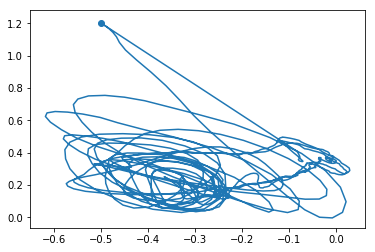

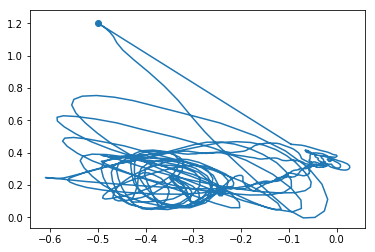

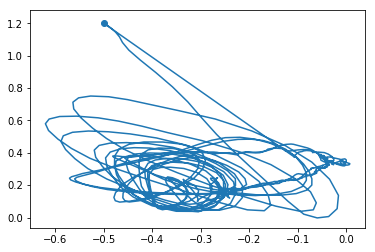




 18%|█▊        | 54/300 [1:54:14<9:24:45, 137.74s/it]

epoch #53	mean reward = -484.032	epsilon = 0.291


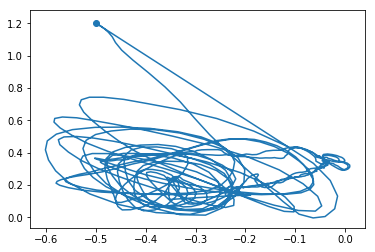

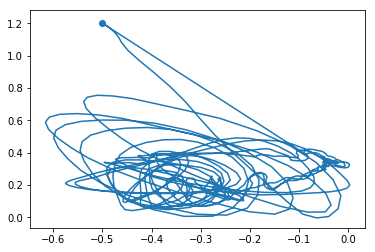

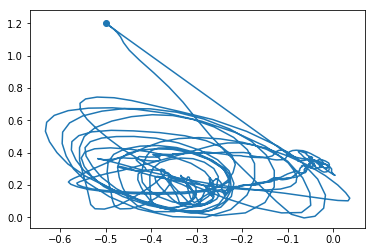




 18%|█▊        | 55/300 [1:56:27<9:16:19, 136.24s/it]

epoch #54	mean reward = -492.677	epsilon = 0.288


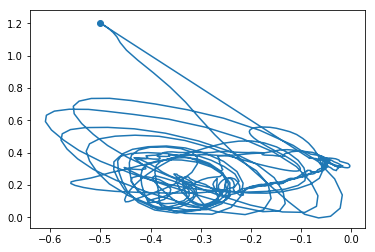

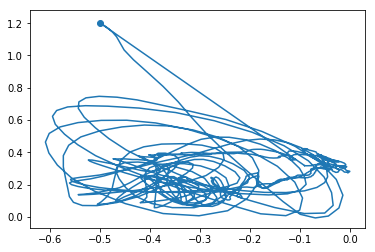

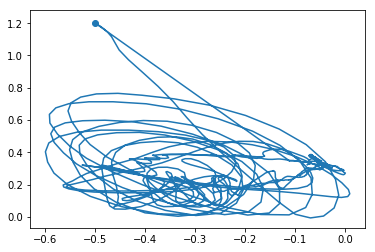




 19%|█▊        | 56/300 [1:58:37<9:06:15, 134.32s/it]

epoch #55	mean reward = -498.051	epsilon = 0.285


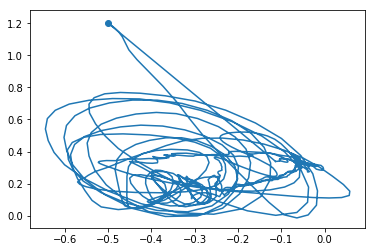

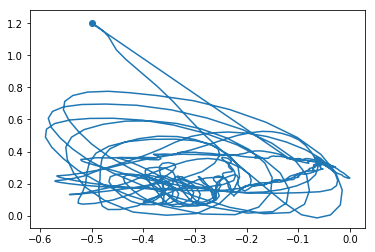

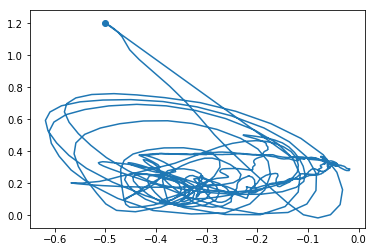




 19%|█▉        | 57/300 [2:00:48<8:59:42, 133.26s/it]

epoch #56	mean reward = -502.427	epsilon = 0.282


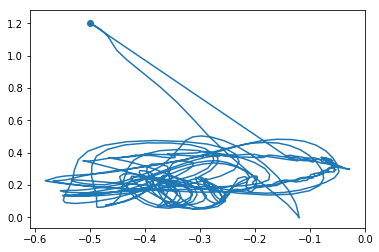

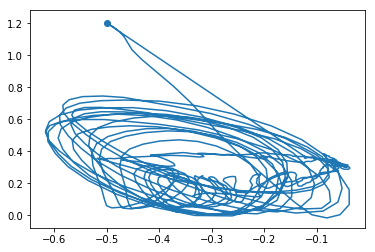

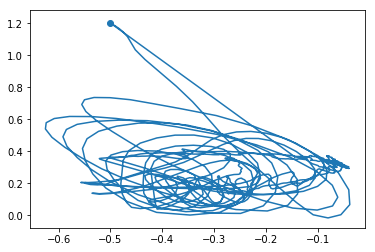




 19%|█▉        | 58/300 [2:02:57<8:52:52, 132.12s/it]

epoch #57	mean reward = -510.908	epsilon = 0.279


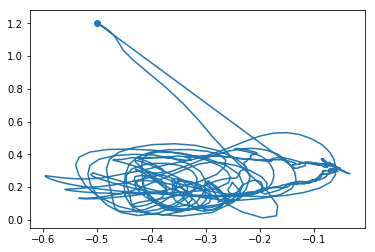

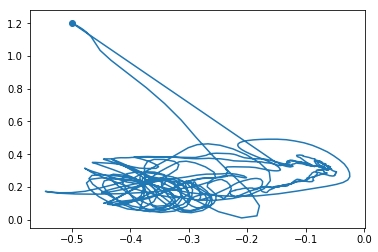

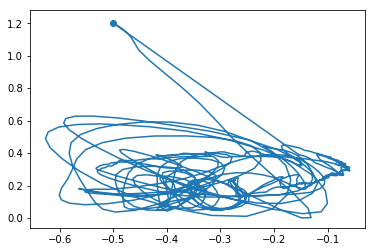




 20%|█▉        | 59/300 [2:05:12<8:54:15, 133.01s/it]

epoch #58	mean reward = -531.601	epsilon = 0.276


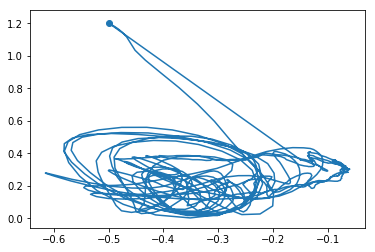

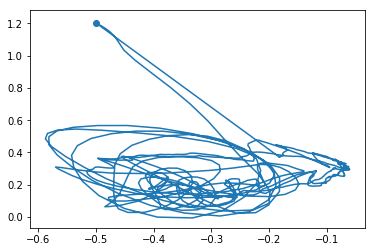

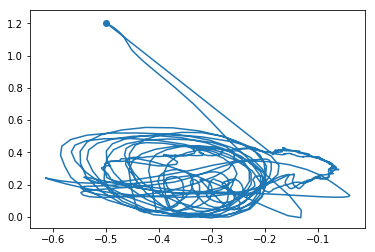




 20%|██        | 60/300 [2:07:22<8:48:52, 132.22s/it]

epoch #59	mean reward = -540.743	epsilon = 0.274


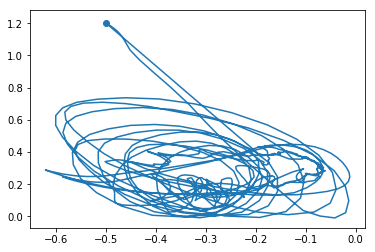

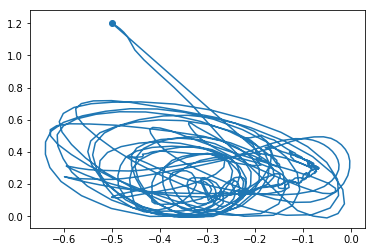

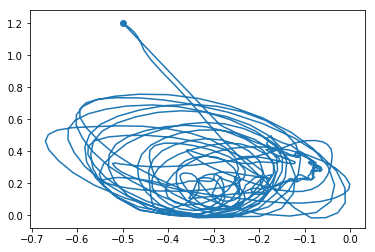




 20%|██        | 61/300 [2:09:46<9:00:42, 135.74s/it]

epoch #60	mean reward = -522.718	epsilon = 0.271


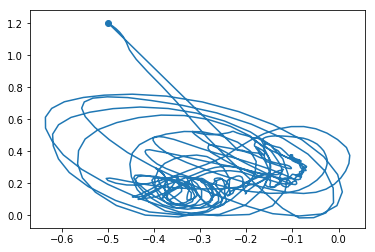

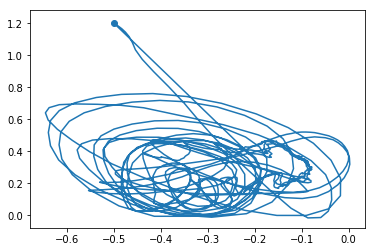

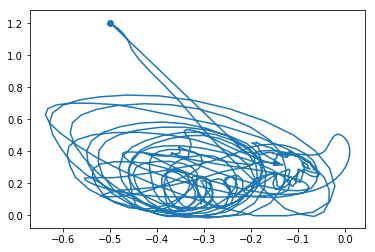




 21%|██        | 62/300 [2:12:03<8:59:27, 136.00s/it]

epoch #61	mean reward = -515.760	epsilon = 0.268


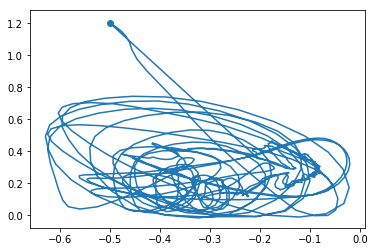

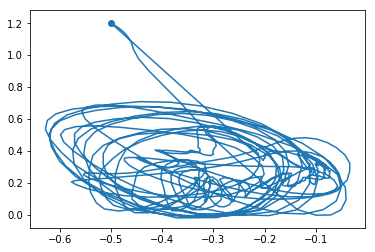

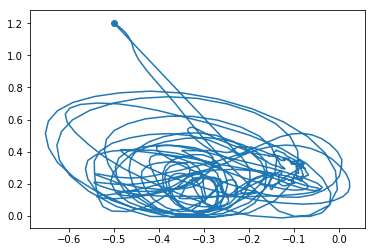




 21%|██        | 63/300 [2:14:12<8:49:06, 133.95s/it]

epoch #62	mean reward = -530.712	epsilon = 0.265


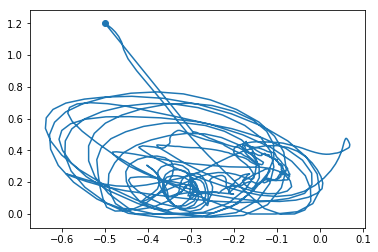

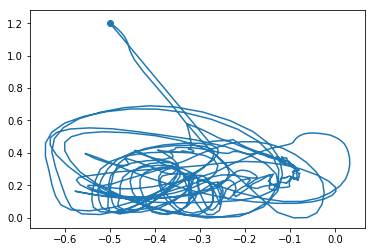

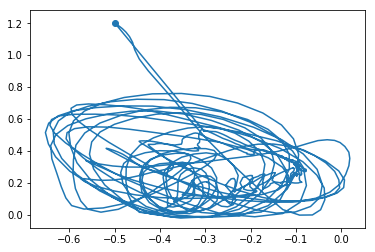




 21%|██▏       | 64/300 [2:16:19<8:38:30, 131.83s/it]

epoch #63	mean reward = -526.696	epsilon = 0.263


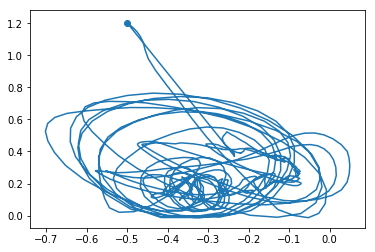

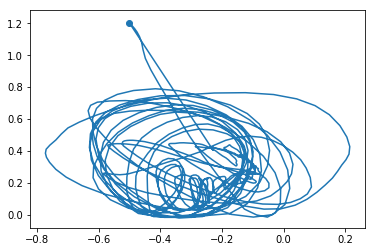

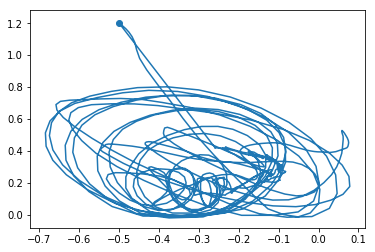




 22%|██▏       | 65/300 [2:18:29<8:34:02, 131.24s/it]

epoch #64	mean reward = -522.053	epsilon = 0.260


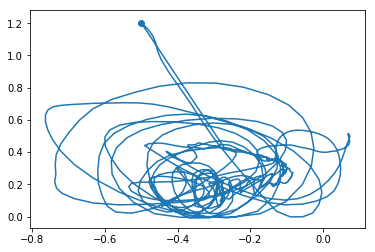

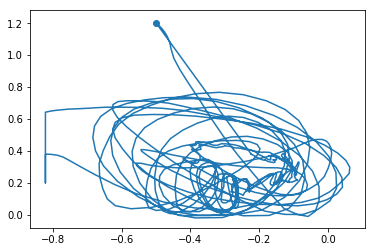

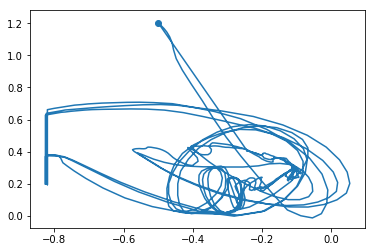




 22%|██▏       | 66/300 [2:20:39<8:29:59, 130.77s/it]

epoch #65	mean reward = -529.691	epsilon = 0.258


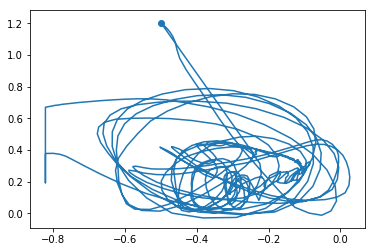

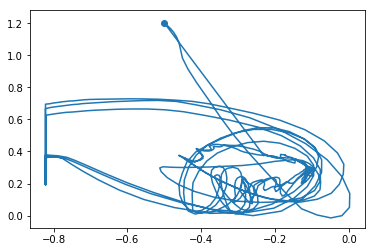

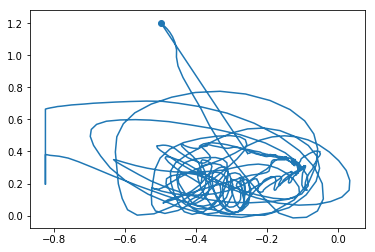




 22%|██▏       | 67/300 [2:22:49<8:27:15, 130.62s/it]

epoch #66	mean reward = -547.798	epsilon = 0.255


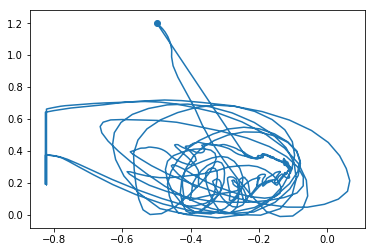

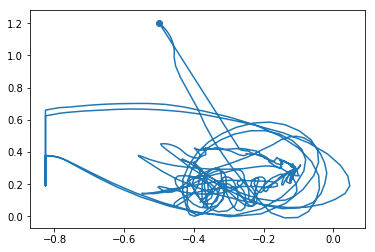

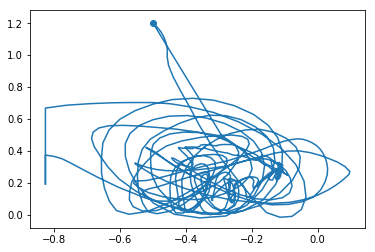




 23%|██▎       | 68/300 [2:25:00<8:25:24, 130.71s/it]

epoch #67	mean reward = -560.653	epsilon = 0.252


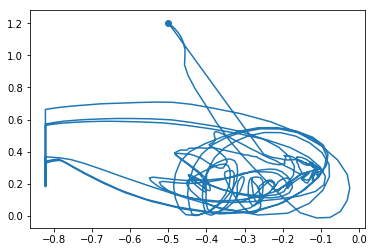

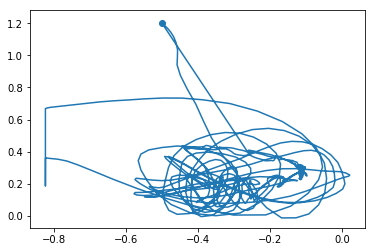

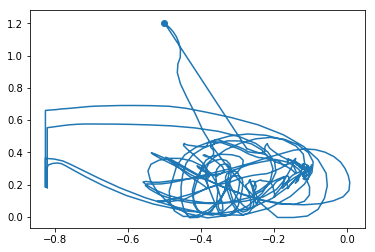




 23%|██▎       | 69/300 [2:27:10<8:22:46, 130.59s/it]

epoch #68	mean reward = -575.340	epsilon = 0.250


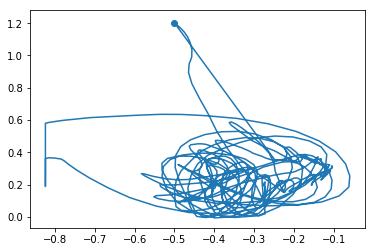

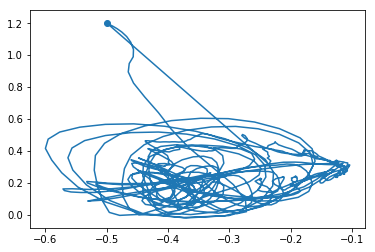

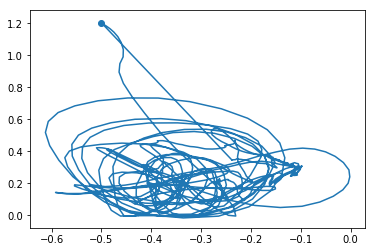




 23%|██▎       | 70/300 [2:29:32<8:33:15, 133.89s/it]

epoch #69	mean reward = -575.935	epsilon = 0.247


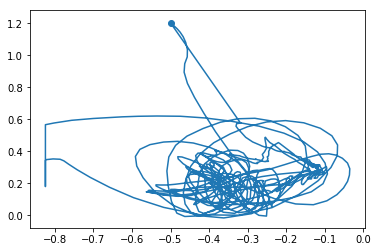

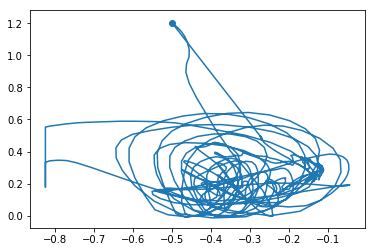

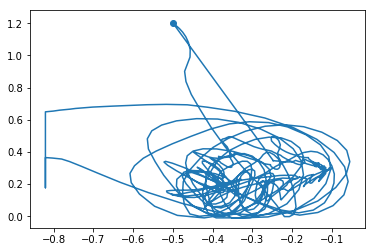




 24%|██▎       | 71/300 [2:31:40<8:24:04, 132.07s/it]

epoch #70	mean reward = -588.799	epsilon = 0.245


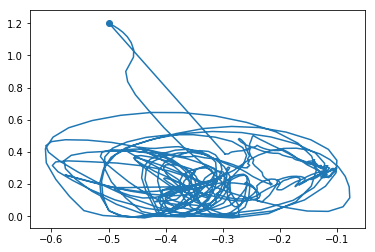

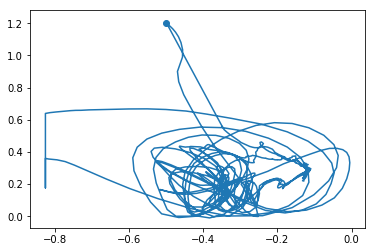

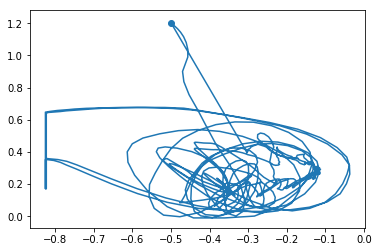




 24%|██▍       | 72/300 [2:33:55<8:26:16, 133.23s/it]

epoch #71	mean reward = -592.041	epsilon = 0.242


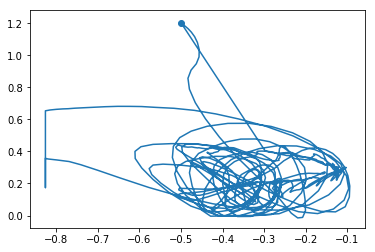

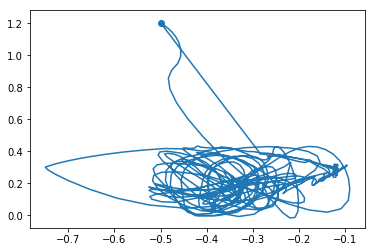

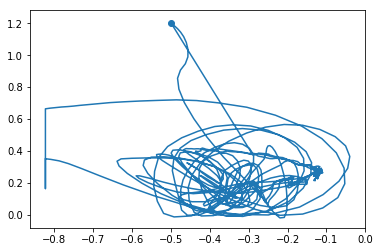




 24%|██▍       | 73/300 [2:36:04<8:18:58, 131.89s/it]

epoch #72	mean reward = -596.086	epsilon = 0.240


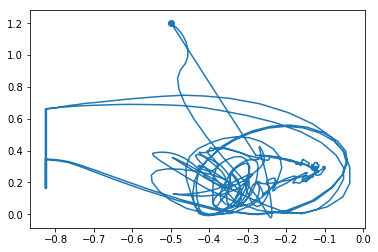

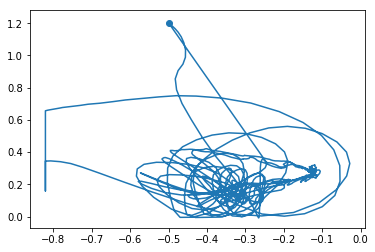

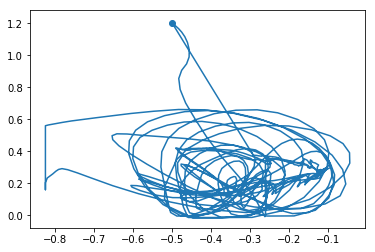




 25%|██▍       | 74/300 [2:38:14<8:14:19, 131.24s/it]

epoch #73	mean reward = -597.760	epsilon = 0.238


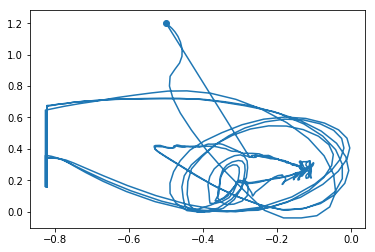

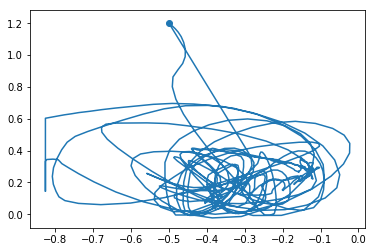

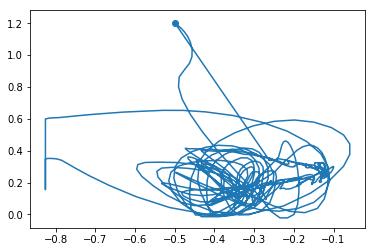




 25%|██▌       | 75/300 [2:40:15<8:00:50, 128.23s/it]

epoch #74	mean reward = -592.925	epsilon = 0.235


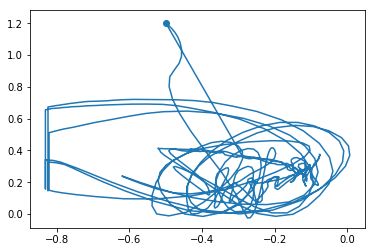

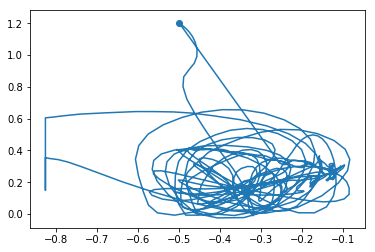

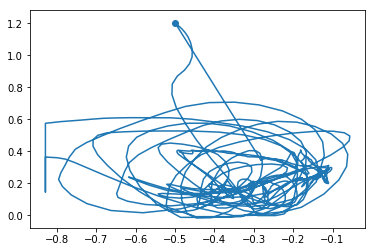




 25%|██▌       | 76/300 [2:42:16<7:50:16, 125.97s/it]

epoch #75	mean reward = -599.306	epsilon = 0.233


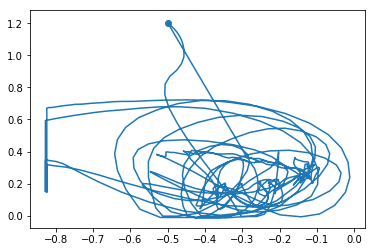

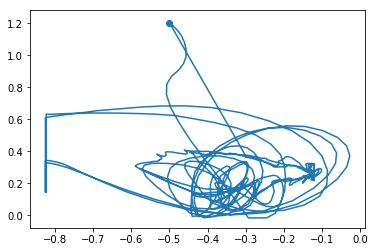

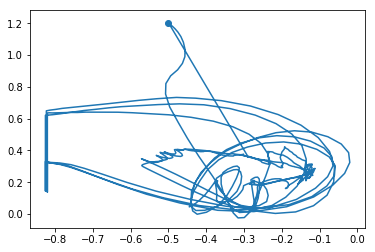




 26%|██▌       | 77/300 [2:44:20<7:45:49, 125.33s/it]

epoch #76	mean reward = -607.747	epsilon = 0.231


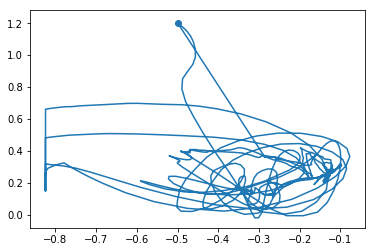

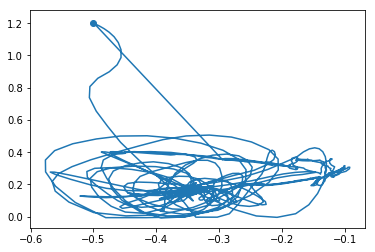

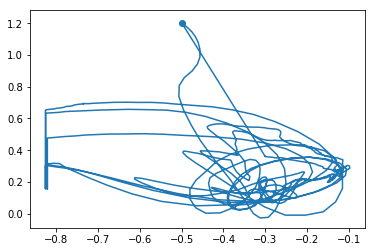




 26%|██▌       | 78/300 [2:46:19<7:37:06, 123.54s/it]

epoch #77	mean reward = -620.023	epsilon = 0.228


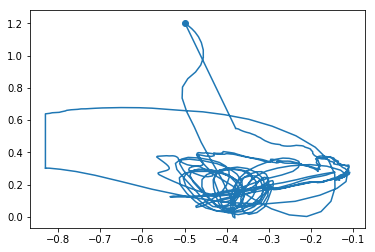

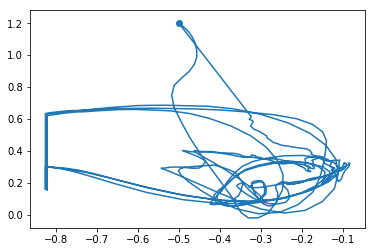

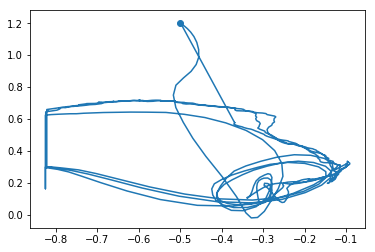




 26%|██▋       | 79/300 [2:48:28<7:40:58, 125.15s/it]

epoch #78	mean reward = -609.441	epsilon = 0.226


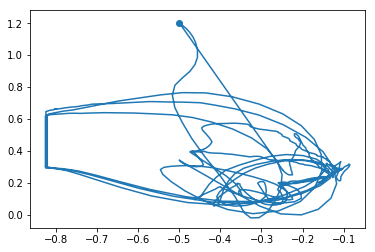

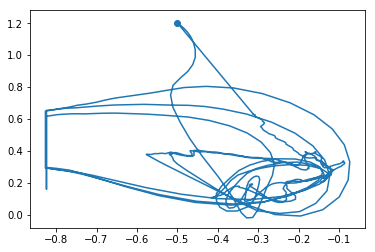

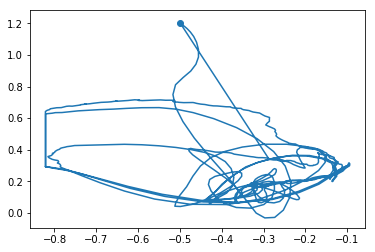




 27%|██▋       | 80/300 [2:50:40<7:45:57, 127.08s/it]

epoch #79	mean reward = -623.814	epsilon = 0.224


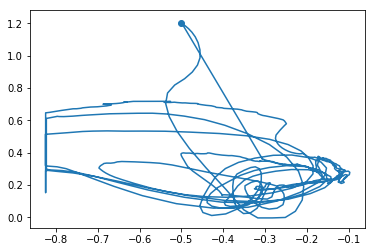

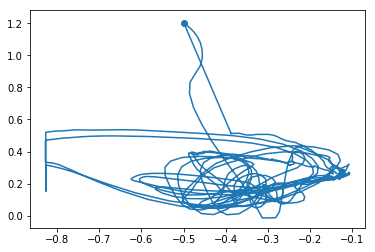

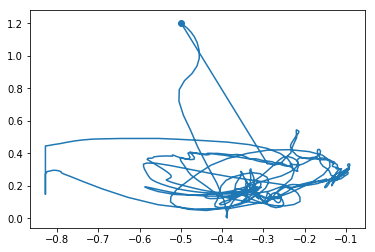




 27%|██▋       | 81/300 [2:52:45<7:41:47, 126.52s/it]

epoch #80	mean reward = -601.550	epsilon = 0.222


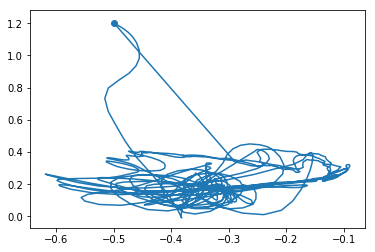

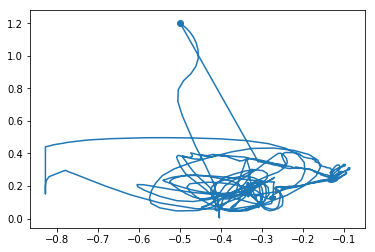

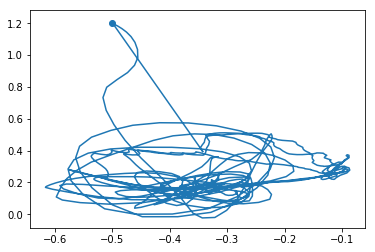




 27%|██▋       | 82/300 [2:54:50<7:38:03, 126.07s/it]

epoch #81	mean reward = -605.747	epsilon = 0.219


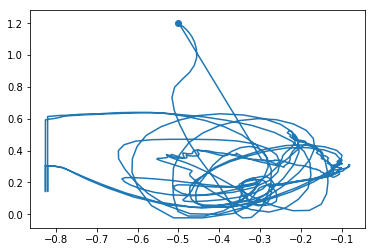

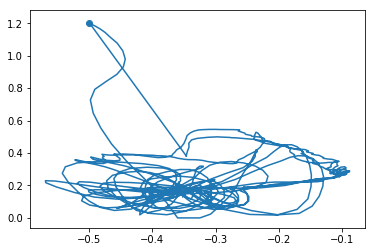

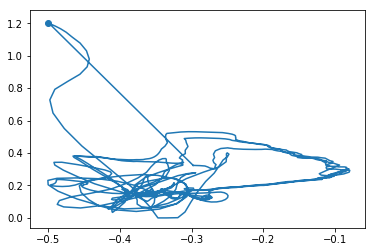




 28%|██▊       | 83/300 [2:57:02<7:43:06, 128.05s/it]

epoch #82	mean reward = -593.974	epsilon = 0.217


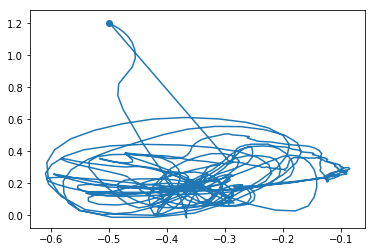

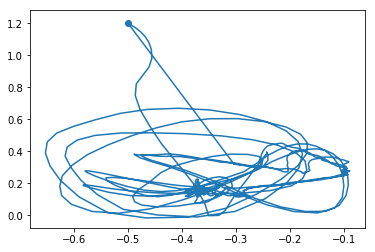

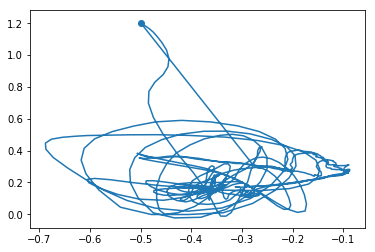




 28%|██▊       | 84/300 [2:59:06<7:35:57, 126.65s/it]

epoch #83	mean reward = -601.937	epsilon = 0.215


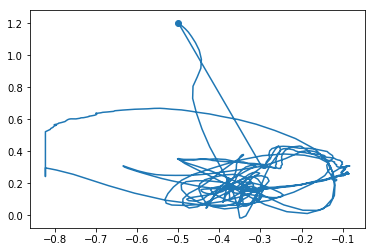

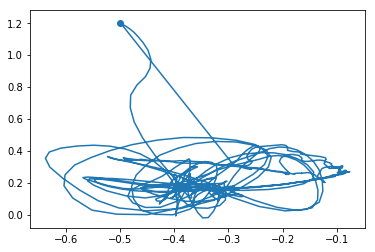

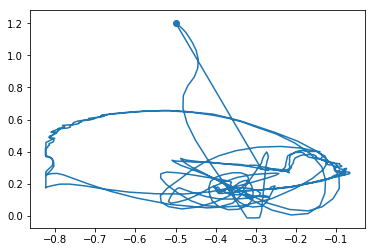




 28%|██▊       | 85/300 [3:01:15<7:36:33, 127.41s/it]

epoch #84	mean reward = -578.039	epsilon = 0.213


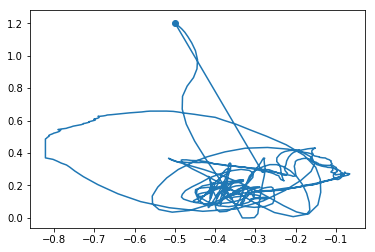

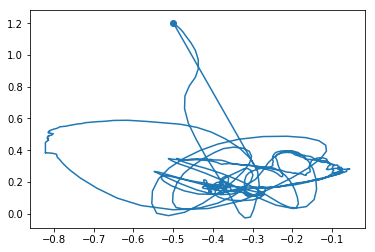

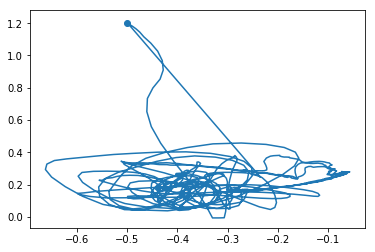




 29%|██▊       | 86/300 [3:03:26<7:38:04, 128.43s/it]

epoch #85	mean reward = -599.122	epsilon = 0.211


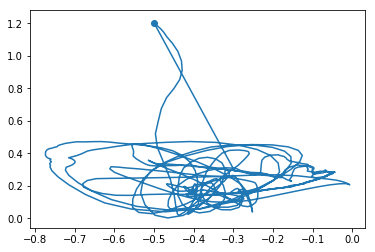

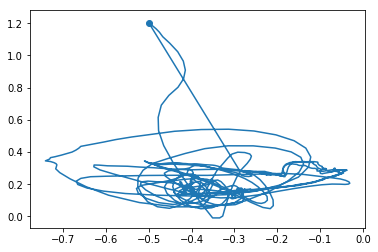

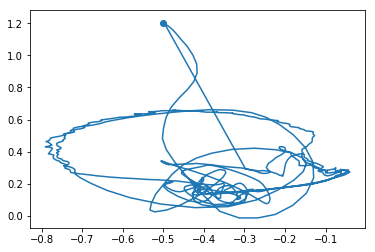




 29%|██▉       | 87/300 [3:05:30<7:31:05, 127.07s/it]

epoch #86	mean reward = -574.775	epsilon = 0.209


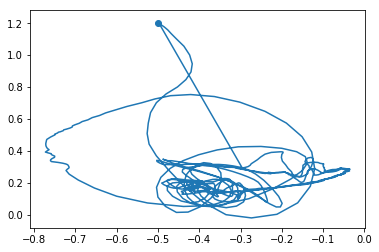

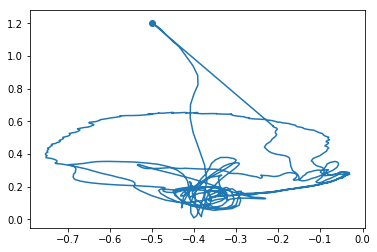

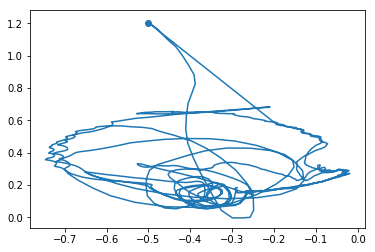




 29%|██▉       | 88/300 [3:07:34<7:26:18, 126.32s/it]

epoch #87	mean reward = -537.907	epsilon = 0.206


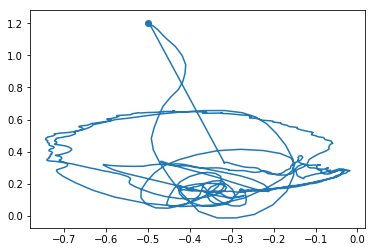

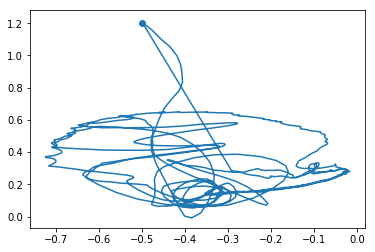

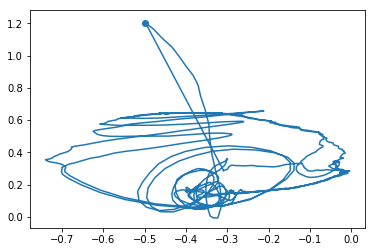




 30%|██▉       | 89/300 [3:09:41<7:24:34, 126.42s/it]

epoch #88	mean reward = -467.219	epsilon = 0.204


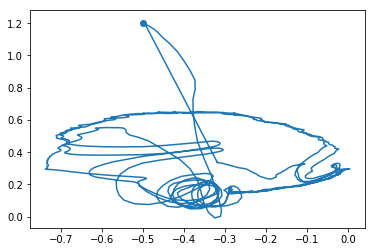

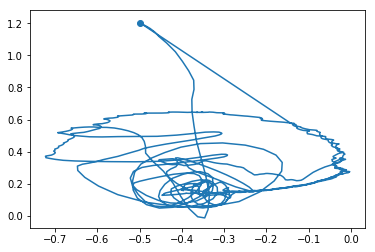

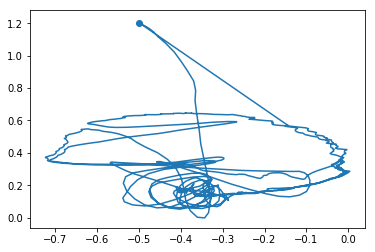




 30%|███       | 90/300 [3:11:47<7:22:04, 126.31s/it]

epoch #89	mean reward = -459.750	epsilon = 0.202


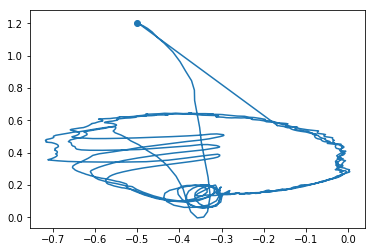

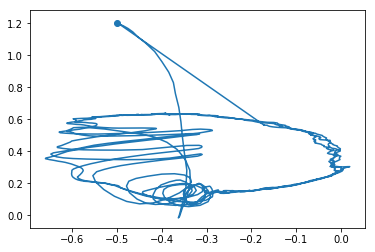

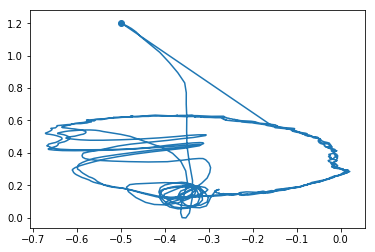




 30%|███       | 91/300 [3:13:55<7:21:40, 126.80s/it]

epoch #90	mean reward = -392.209	epsilon = 0.200


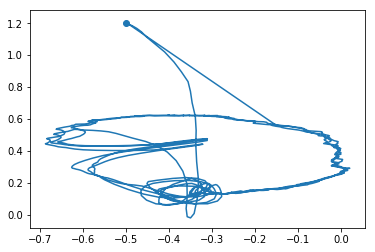

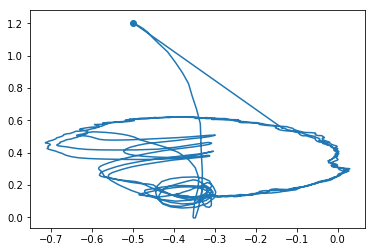

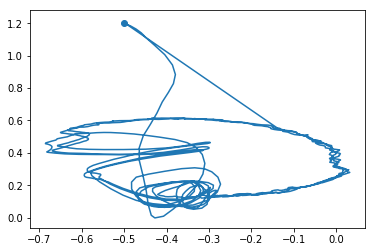




 31%|███       | 92/300 [3:15:58<7:15:32, 125.64s/it]

epoch #91	mean reward = -402.252	epsilon = 0.198


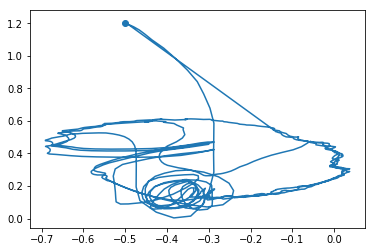

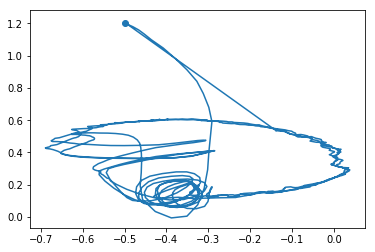

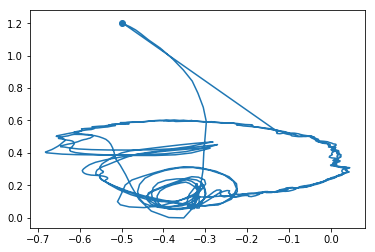




 31%|███       | 93/300 [3:18:00<7:10:12, 124.70s/it]

epoch #92	mean reward = -416.659	epsilon = 0.196


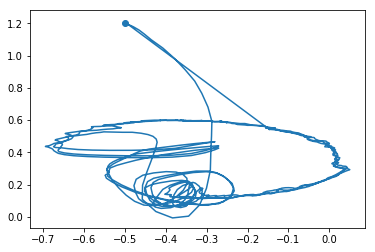

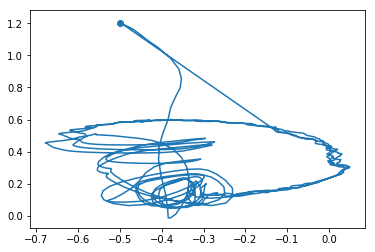

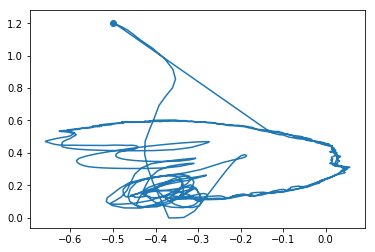




 31%|███▏      | 94/300 [3:20:06<7:09:36, 125.13s/it]

epoch #93	mean reward = -414.520	epsilon = 0.194


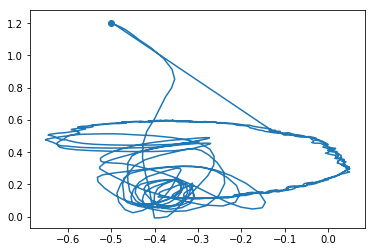

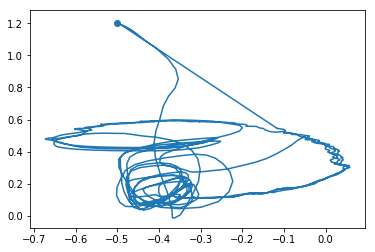

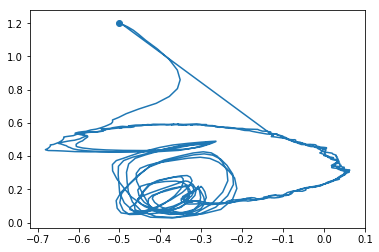




 32%|███▏      | 95/300 [3:22:16<7:11:45, 126.37s/it]

epoch #94	mean reward = -418.587	epsilon = 0.192


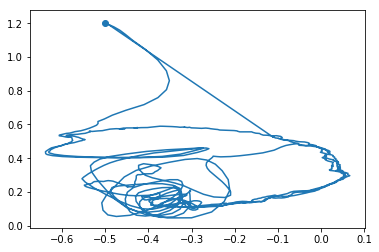

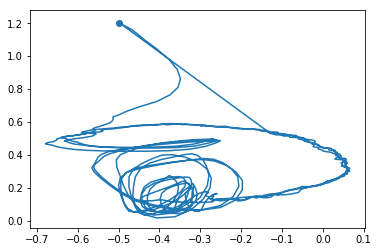

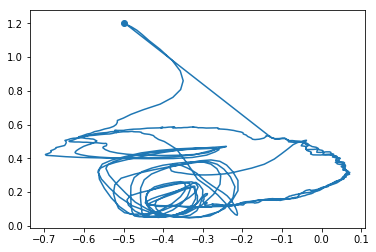




 32%|███▏      | 96/300 [3:24:26<7:13:41, 127.56s/it]

epoch #95	mean reward = -436.279	epsilon = 0.191


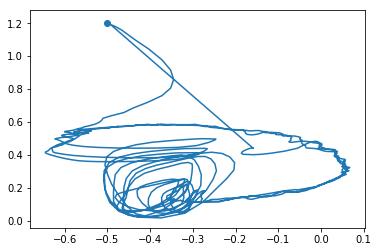

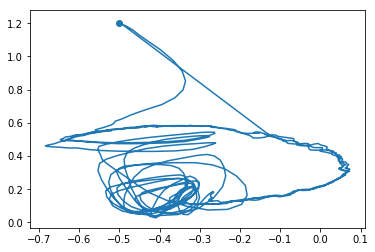

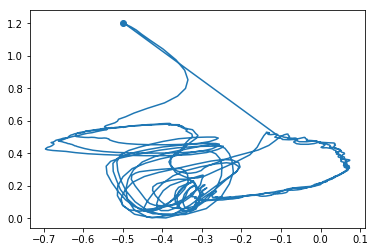




 32%|███▏      | 97/300 [3:26:34<7:12:24, 127.81s/it]

epoch #96	mean reward = -418.526	epsilon = 0.189


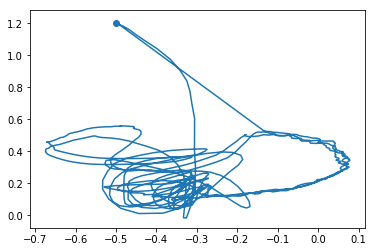

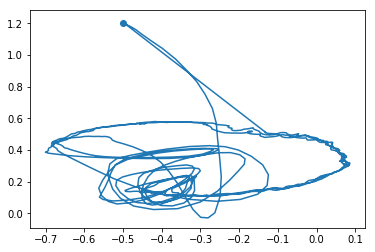

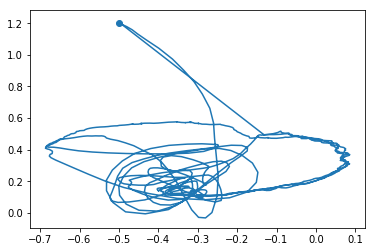




 33%|███▎      | 98/300 [3:28:41<7:09:03, 127.44s/it]

epoch #97	mean reward = -471.041	epsilon = 0.187


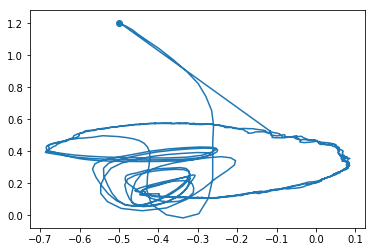

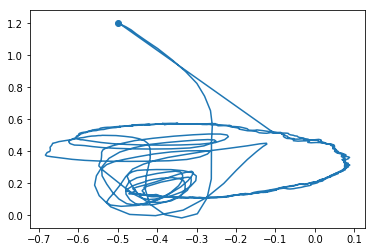

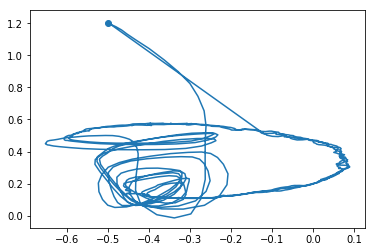




 33%|███▎      | 99/300 [3:30:53<7:11:04, 128.68s/it]

epoch #98	mean reward = -421.742	epsilon = 0.185


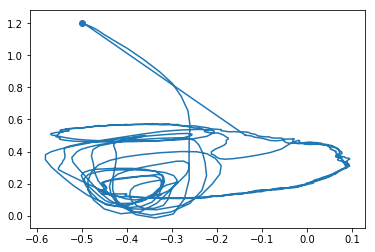

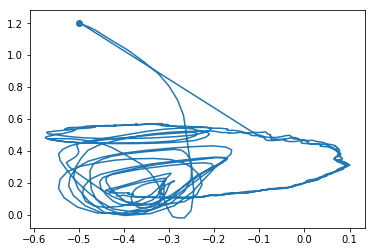

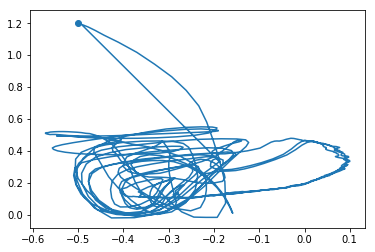




 33%|███▎      | 100/300 [3:33:01<7:09:08, 128.74s/it]

epoch #99	mean reward = -450.388	epsilon = 0.183


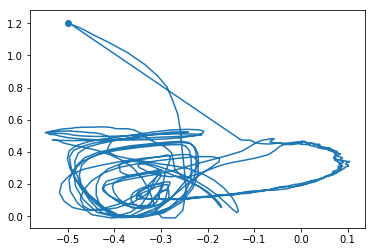

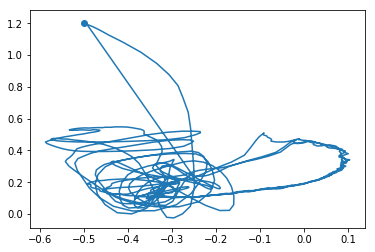

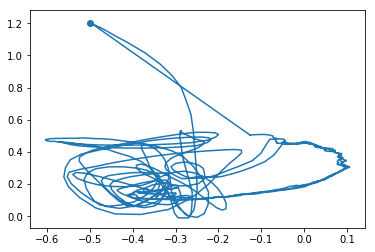




 34%|███▎      | 101/300 [3:35:11<7:07:24, 128.87s/it]

epoch #100	mean reward = -506.155	epsilon = 0.181


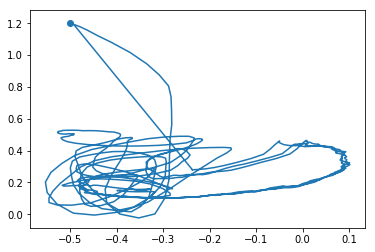

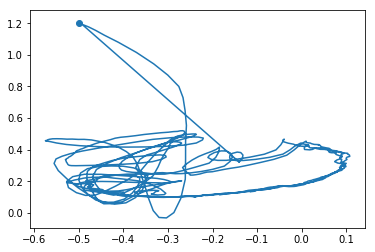

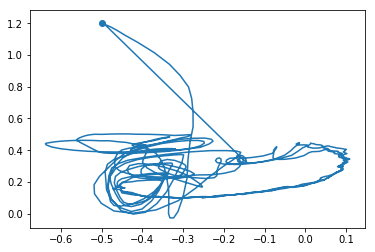




 34%|███▍      | 102/300 [3:37:16<7:01:40, 127.78s/it]

epoch #101	mean reward = -516.366	epsilon = 0.179


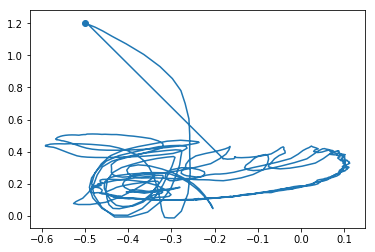

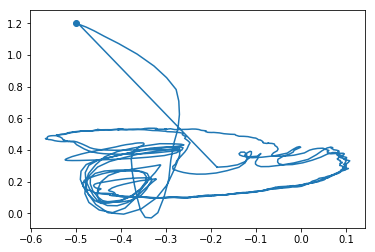

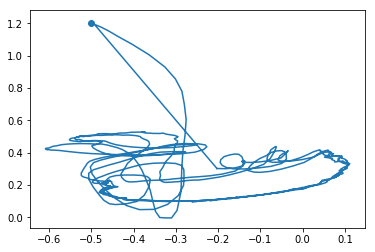




 34%|███▍      | 103/300 [3:39:25<7:00:48, 128.17s/it]

epoch #102	mean reward = -495.179	epsilon = 0.178


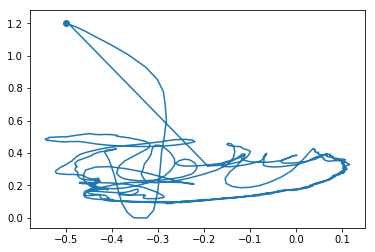

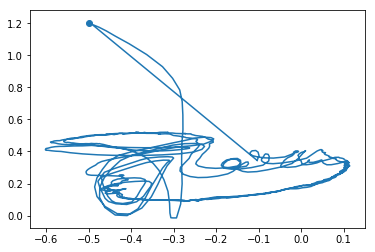

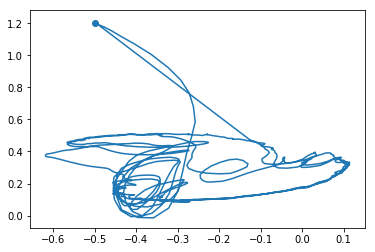




 35%|███▍      | 104/300 [3:41:33<6:58:46, 128.20s/it]

epoch #103	mean reward = -495.632	epsilon = 0.176


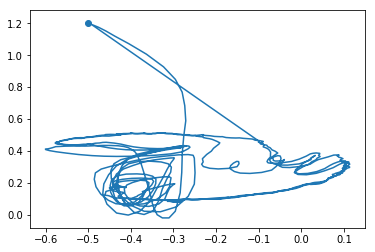

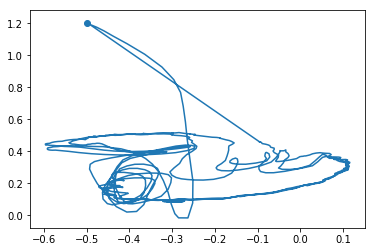

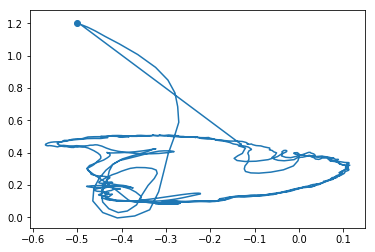




 35%|███▌      | 105/300 [3:43:48<7:02:50, 130.11s/it]

epoch #104	mean reward = -485.596	epsilon = 0.174


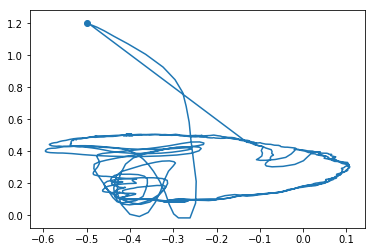

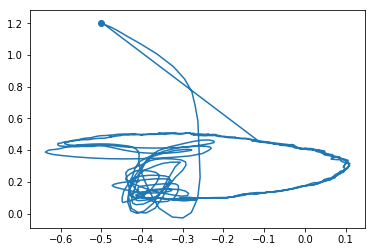

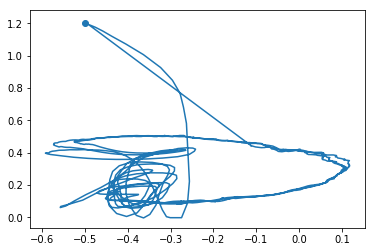




 35%|███▌      | 106/300 [3:46:03<7:05:50, 131.71s/it]

epoch #105	mean reward = -475.554	epsilon = 0.172


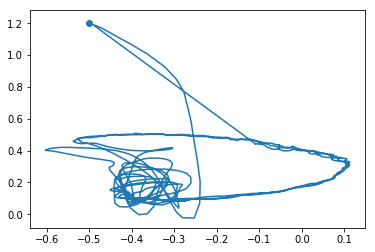

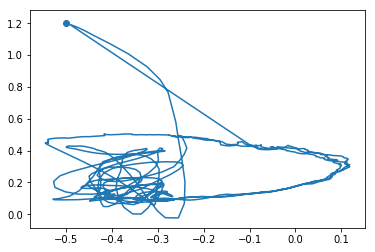

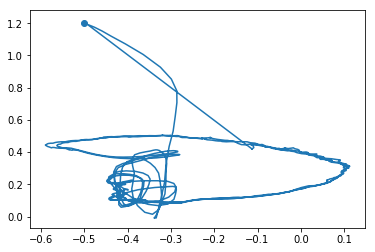




 36%|███▌      | 107/300 [3:48:20<7:08:46, 133.30s/it]

epoch #106	mean reward = -499.675	epsilon = 0.171


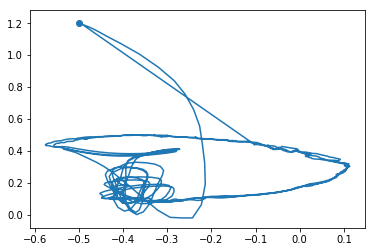

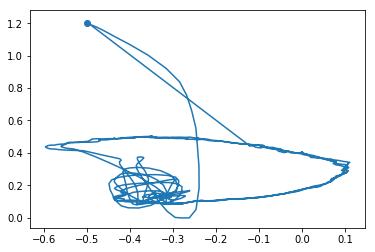

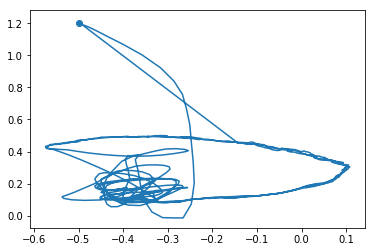




 36%|███▌      | 108/300 [3:50:32<7:05:21, 132.92s/it]

epoch #107	mean reward = -506.632	epsilon = 0.169


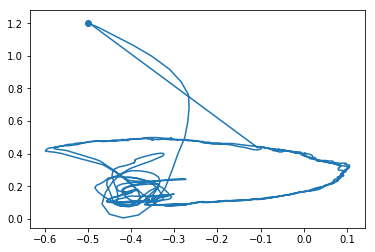

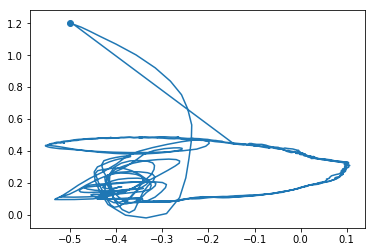

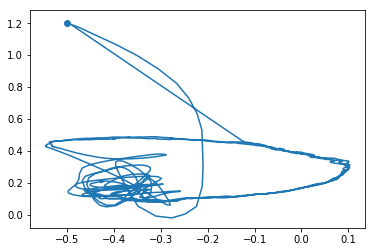




 36%|███▋      | 109/300 [3:52:41<6:59:09, 131.67s/it]

epoch #108	mean reward = -512.111	epsilon = 0.167


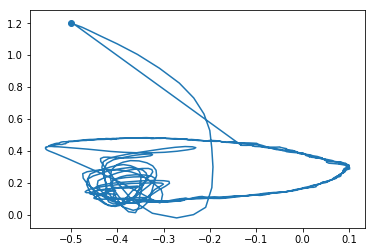

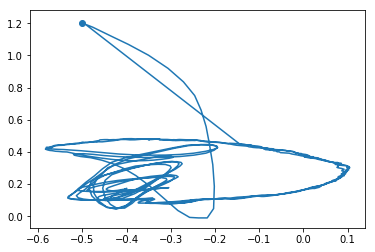

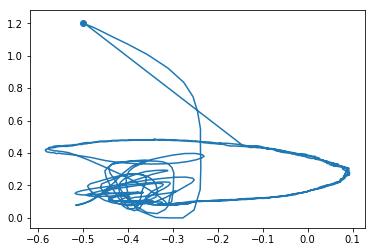




 37%|███▋      | 110/300 [3:54:50<6:54:23, 130.86s/it]

epoch #109	mean reward = -510.139	epsilon = 0.166


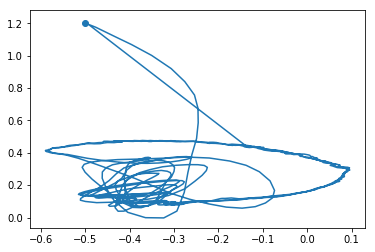

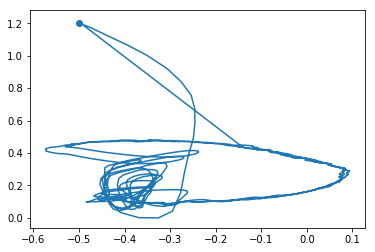

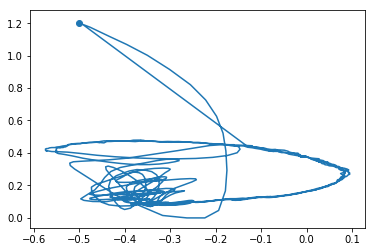




 37%|███▋      | 111/300 [3:56:56<6:47:52, 129.48s/it]

epoch #110	mean reward = -516.771	epsilon = 0.164


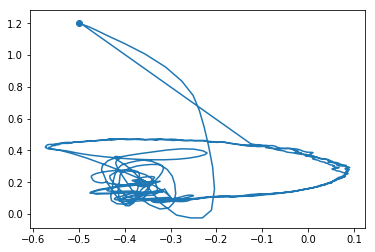

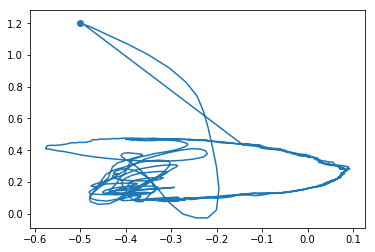

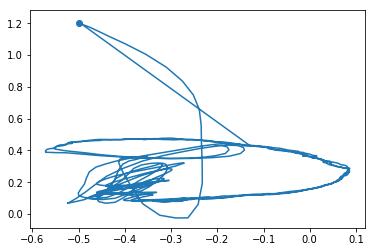




 37%|███▋      | 112/300 [3:59:09<6:48:28, 130.36s/it]

epoch #111	mean reward = -517.759	epsilon = 0.162


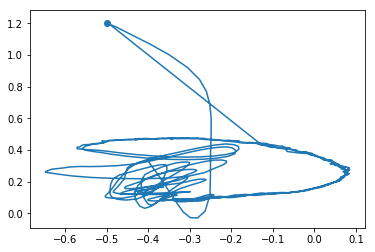

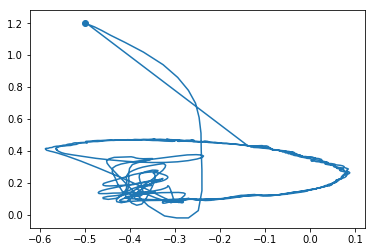

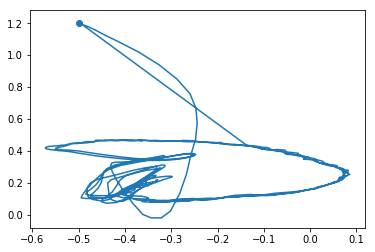




 38%|███▊      | 113/300 [4:01:20<6:47:22, 130.71s/it]

epoch #112	mean reward = -515.832	epsilon = 0.161


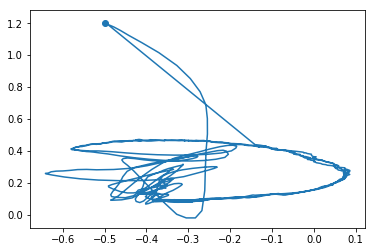

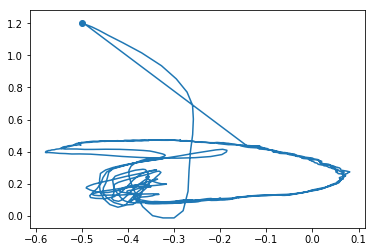

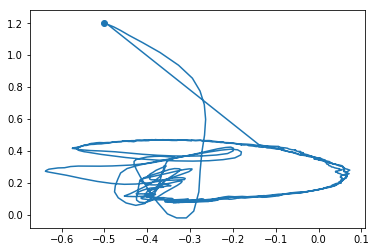




 38%|███▊      | 114/300 [4:03:33<6:46:49, 131.23s/it]

epoch #113	mean reward = -516.438	epsilon = 0.159


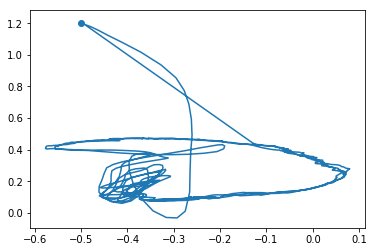

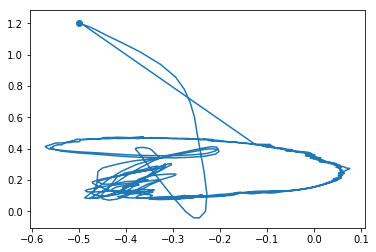

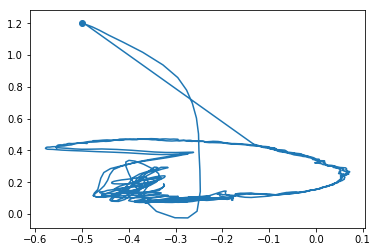




 38%|███▊      | 115/300 [4:05:41<6:42:21, 130.49s/it]

epoch #114	mean reward = -522.858	epsilon = 0.157


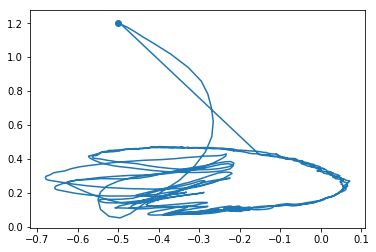

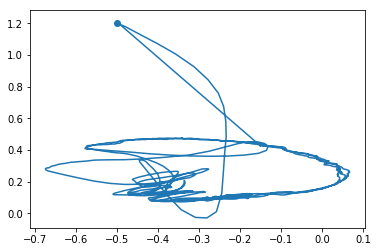

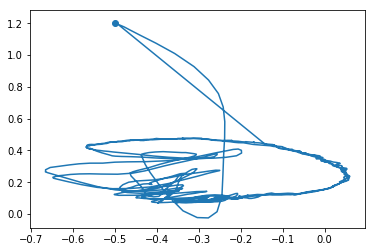




 39%|███▊      | 116/300 [4:07:52<6:40:00, 130.44s/it]

epoch #115	mean reward = -519.282	epsilon = 0.156


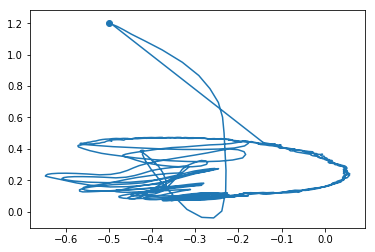

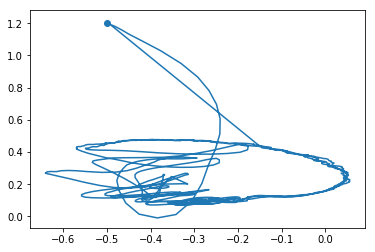

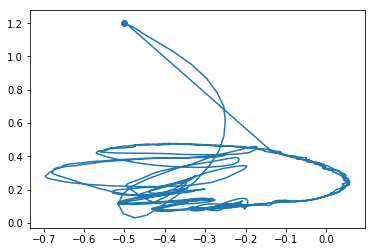




 39%|███▉      | 117/300 [4:10:01<6:36:58, 130.16s/it]

epoch #116	mean reward = -516.012	epsilon = 0.154


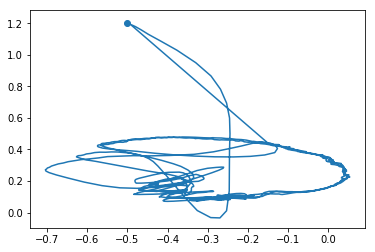

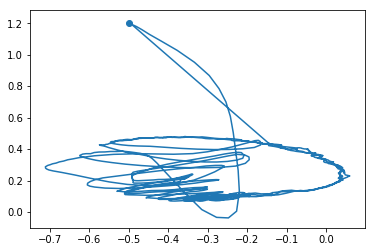

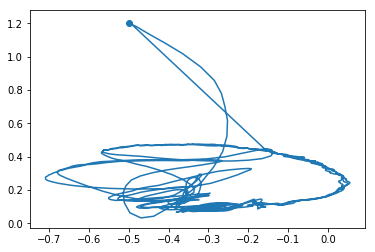




 39%|███▉      | 118/300 [4:12:11<6:34:50, 130.17s/it]

epoch #117	mean reward = -523.398	epsilon = 0.153


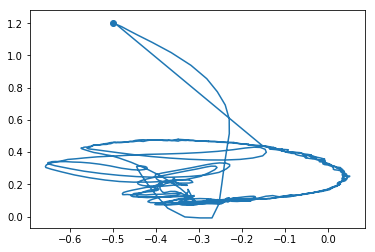

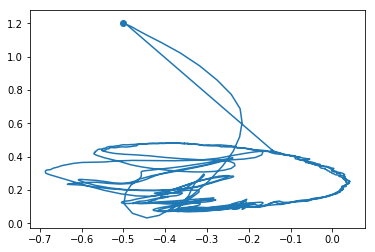

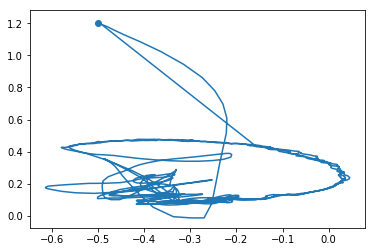




 40%|███▉      | 119/300 [4:14:15<6:27:08, 128.33s/it]

epoch #118	mean reward = -528.499	epsilon = 0.151


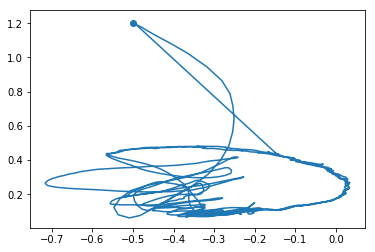

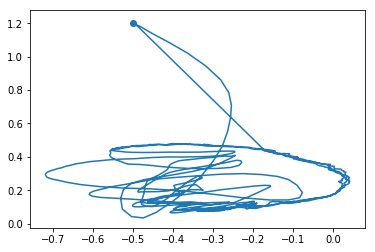

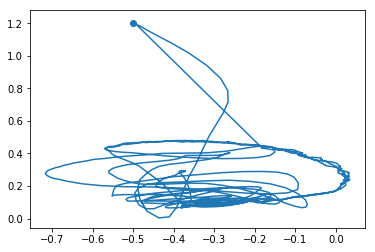




 40%|████      | 120/300 [4:16:28<6:28:22, 129.46s/it]

epoch #119	mean reward = -524.585	epsilon = 0.150


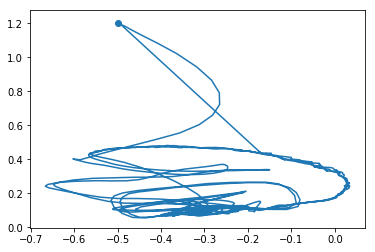

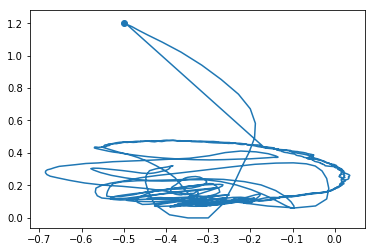

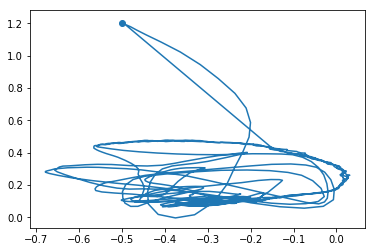




 40%|████      | 121/300 [4:18:36<6:25:29, 129.21s/it]

epoch #120	mean reward = -540.558	epsilon = 0.148


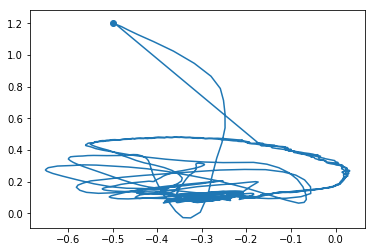

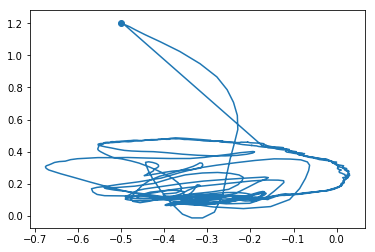

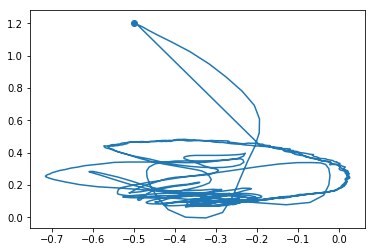




 41%|████      | 122/300 [4:20:48<6:25:28, 129.94s/it]

epoch #121	mean reward = -540.795	epsilon = 0.147


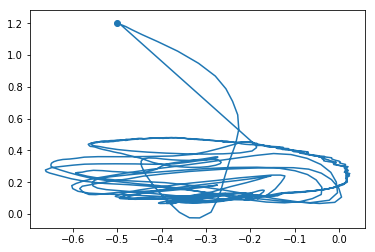

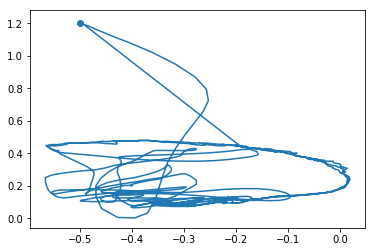

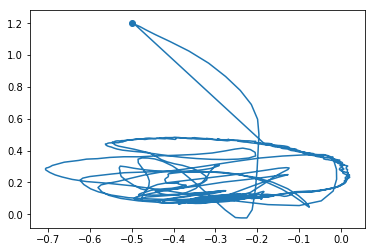




 41%|████      | 123/300 [4:22:54<6:20:01, 128.82s/it]

epoch #122	mean reward = -534.305	epsilon = 0.145


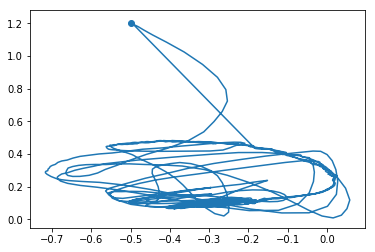

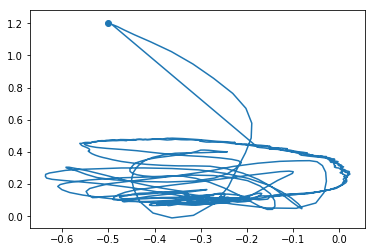

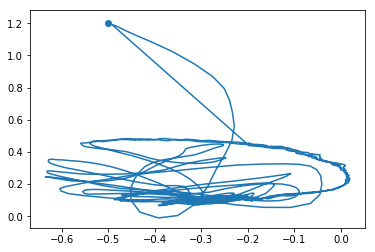




 41%|████▏     | 124/300 [4:25:06<6:20:38, 129.76s/it]

epoch #123	mean reward = -542.011	epsilon = 0.144


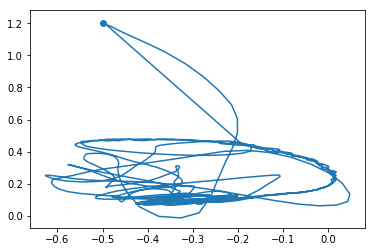

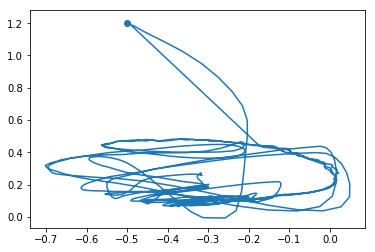

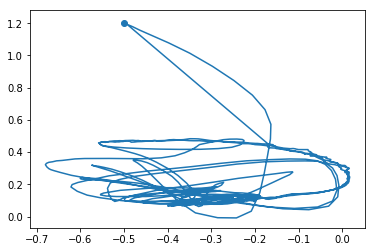




 42%|████▏     | 125/300 [4:27:19<6:20:59, 130.62s/it]

epoch #124	mean reward = -540.650	epsilon = 0.142


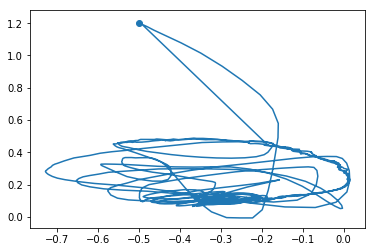

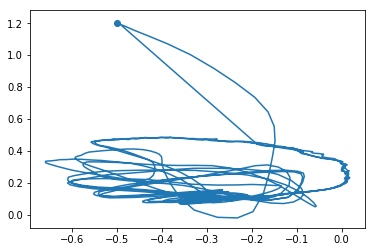

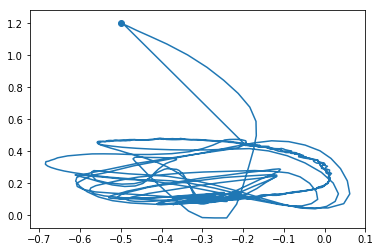




 42%|████▏     | 126/300 [4:29:32<6:21:03, 131.40s/it]

epoch #125	mean reward = -544.826	epsilon = 0.141


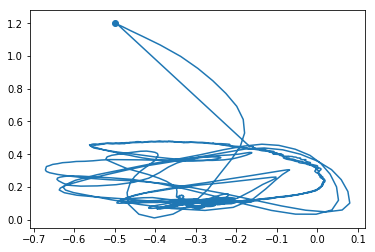

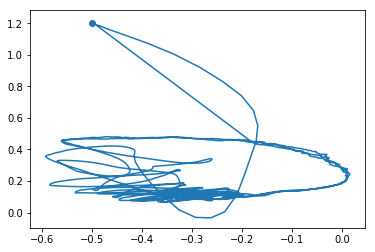

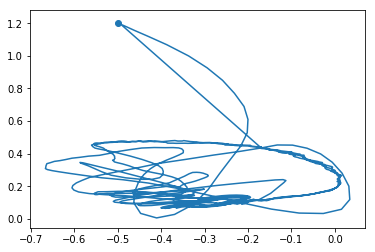




 42%|████▏     | 127/300 [4:31:47<6:21:52, 132.44s/it]

epoch #126	mean reward = -543.811	epsilon = 0.140


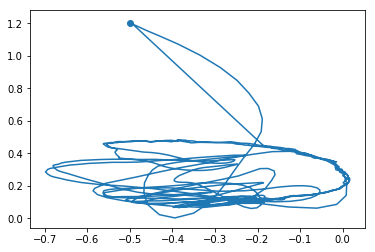

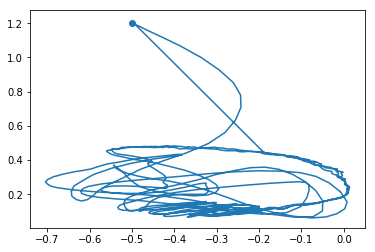

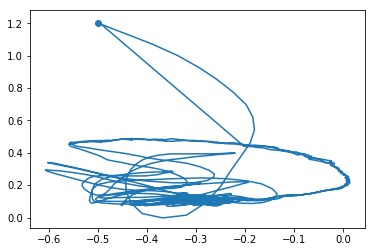




 43%|████▎     | 128/300 [4:33:54<6:15:27, 130.97s/it]

epoch #127	mean reward = -538.197	epsilon = 0.138


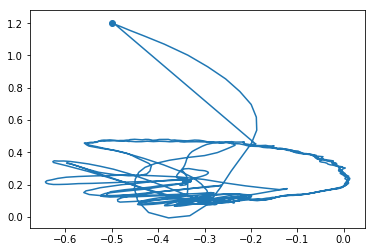

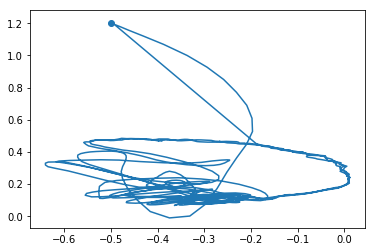

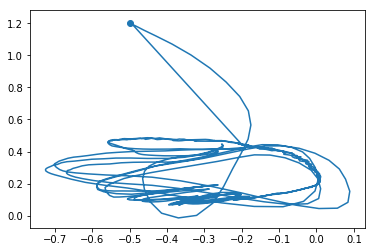




 43%|████▎     | 129/300 [4:36:08<6:15:40, 131.82s/it]

epoch #128	mean reward = -536.329	epsilon = 0.137


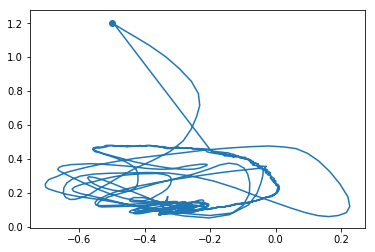

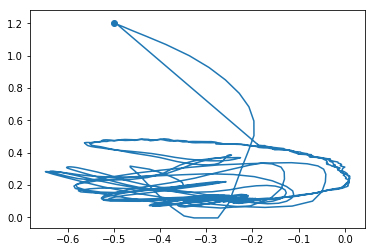

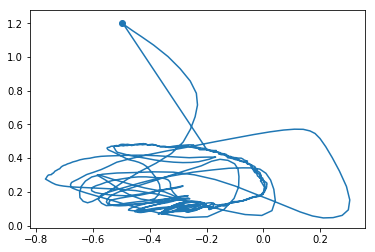




 43%|████▎     | 130/300 [4:38:17<6:10:40, 130.83s/it]

epoch #129	mean reward = -543.591	epsilon = 0.135


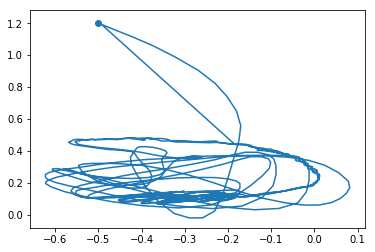

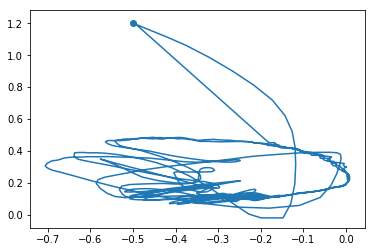

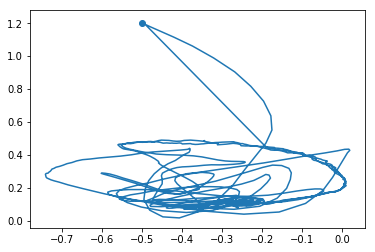




 44%|████▎     | 131/300 [4:40:28<6:09:04, 131.03s/it]

epoch #130	mean reward = -544.122	epsilon = 0.134


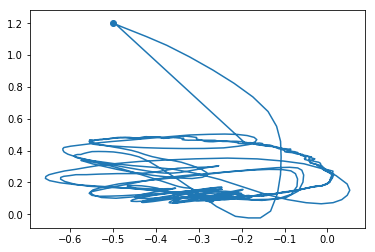

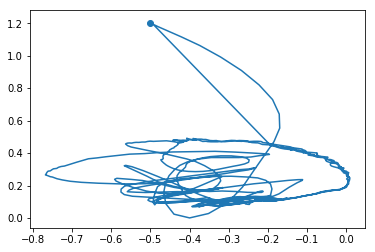

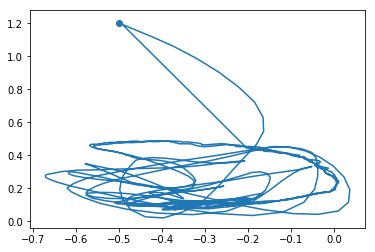




 44%|████▍     | 132/300 [4:42:39<6:06:57, 131.06s/it]

epoch #131	mean reward = -537.734	epsilon = 0.133


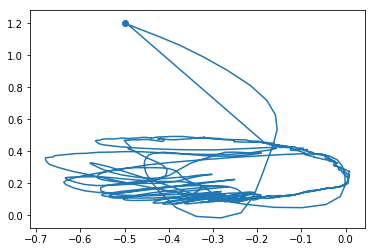

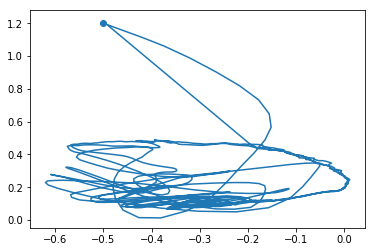

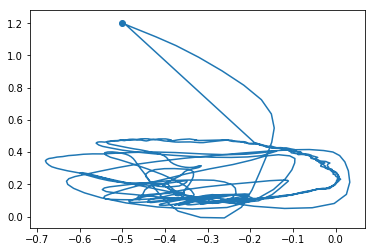




 44%|████▍     | 133/300 [4:44:52<6:05:52, 131.45s/it]

epoch #132	mean reward = -536.880	epsilon = 0.131


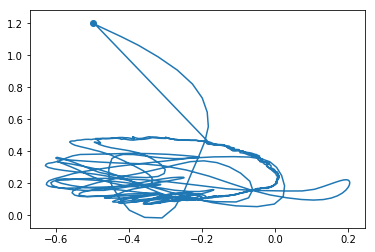

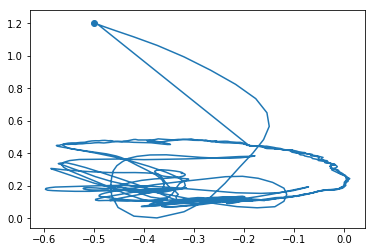

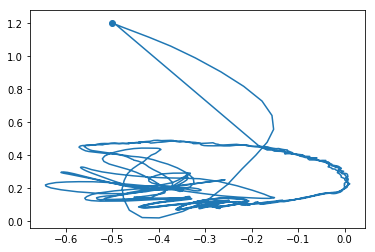




 45%|████▍     | 134/300 [4:47:03<6:03:56, 131.55s/it]

epoch #133	mean reward = -540.032	epsilon = 0.130


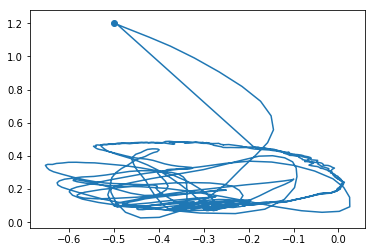

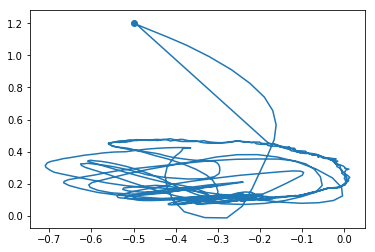

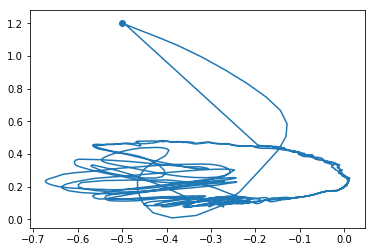




 45%|████▌     | 135/300 [4:49:17<6:03:20, 132.12s/it]

epoch #134	mean reward = -538.996	epsilon = 0.129


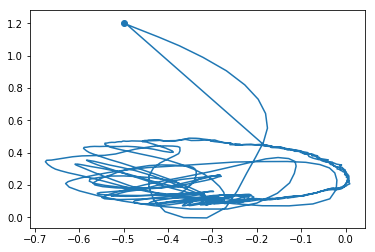

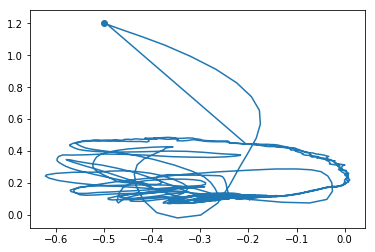

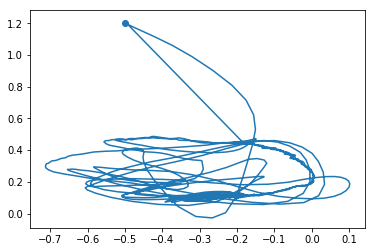




 45%|████▌     | 136/300 [4:51:27<5:59:51, 131.66s/it]

epoch #135	mean reward = -539.622	epsilon = 0.127


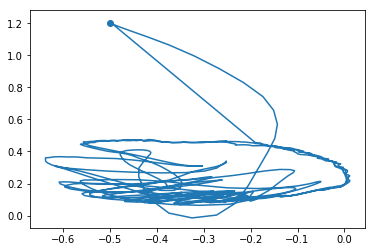

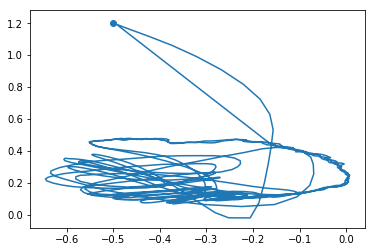

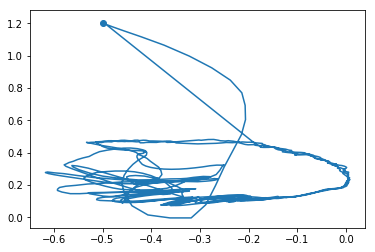




 46%|████▌     | 137/300 [4:53:37<5:55:37, 130.91s/it]

epoch #136	mean reward = -541.727	epsilon = 0.126


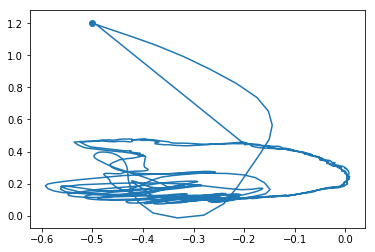

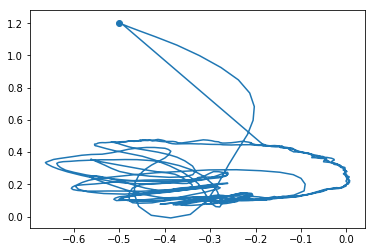

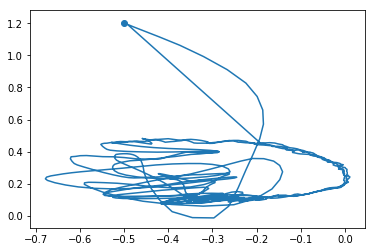




 46%|████▌     | 138/300 [4:55:46<5:52:21, 130.50s/it]

epoch #137	mean reward = -536.344	epsilon = 0.125


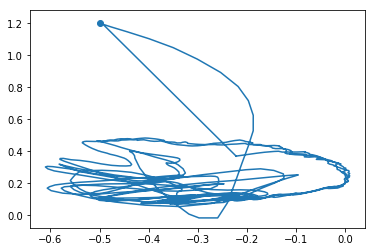

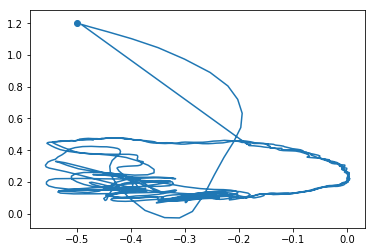

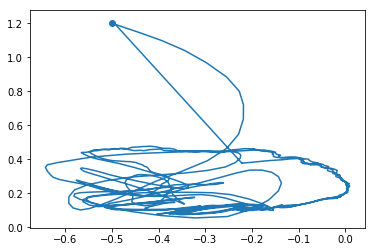




 46%|████▋     | 139/300 [4:57:57<5:50:13, 130.52s/it]

epoch #138	mean reward = -543.651	epsilon = 0.124


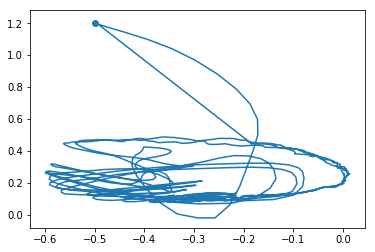

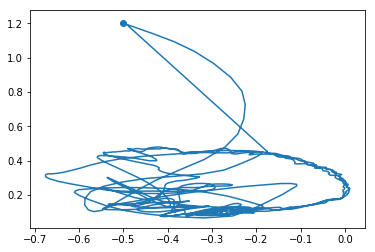

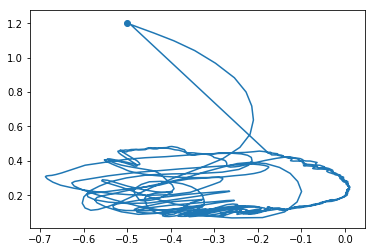




 47%|████▋     | 140/300 [5:00:11<5:51:27, 131.79s/it]

epoch #139	mean reward = -536.419	epsilon = 0.122


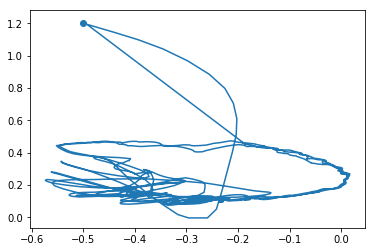

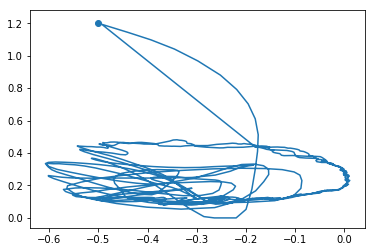

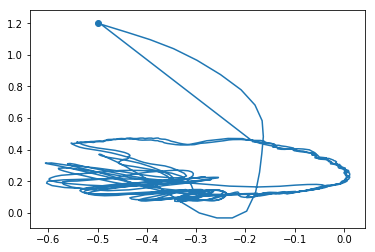




 47%|████▋     | 141/300 [5:02:26<5:51:37, 132.69s/it]

epoch #140	mean reward = -543.057	epsilon = 0.121


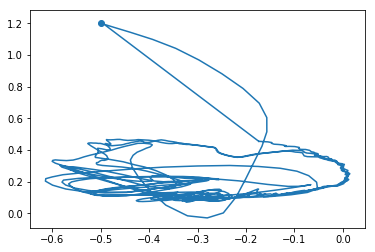

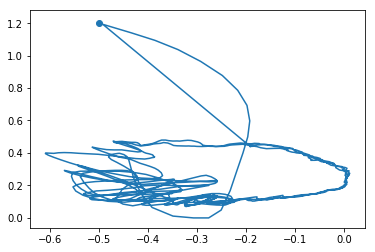

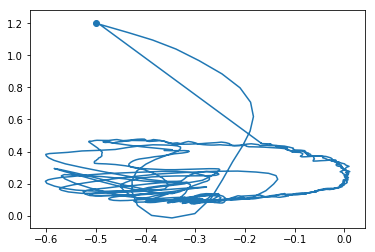




 47%|████▋     | 142/300 [5:04:38<5:49:05, 132.57s/it]

epoch #141	mean reward = -539.313	epsilon = 0.120


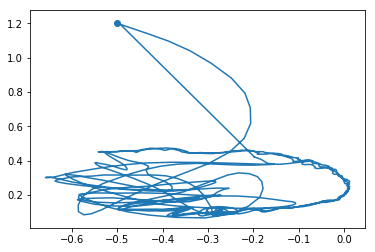

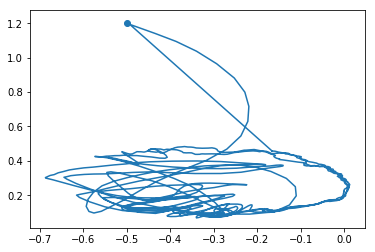

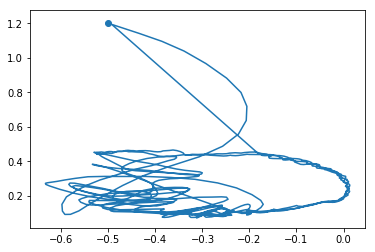




 48%|████▊     | 143/300 [5:06:50<5:46:06, 132.27s/it]

epoch #142	mean reward = -534.064	epsilon = 0.119


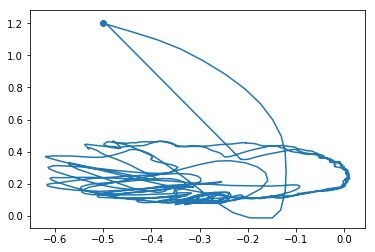

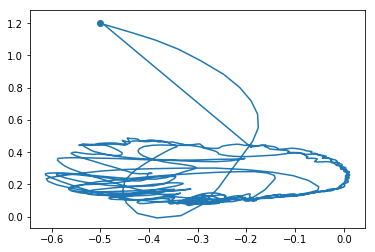

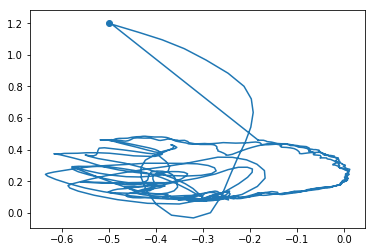




 48%|████▊     | 144/300 [5:09:01<5:42:48, 131.85s/it]

epoch #143	mean reward = -533.490	epsilon = 0.118


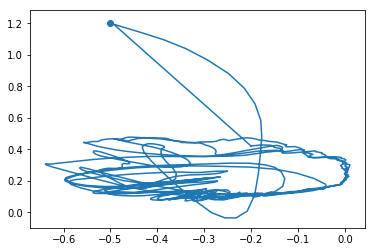

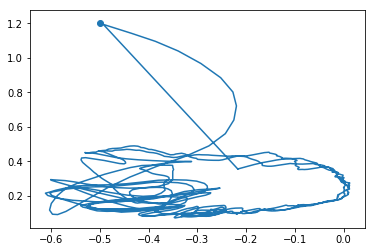

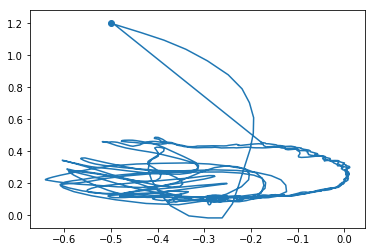




 48%|████▊     | 145/300 [5:11:14<5:41:55, 132.36s/it]

epoch #144	mean reward = -537.553	epsilon = 0.116


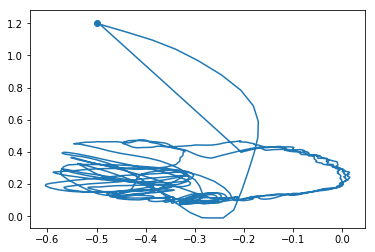

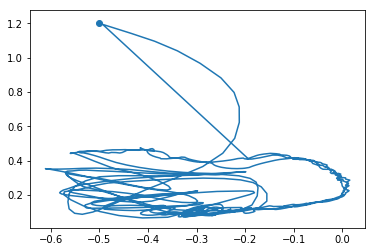

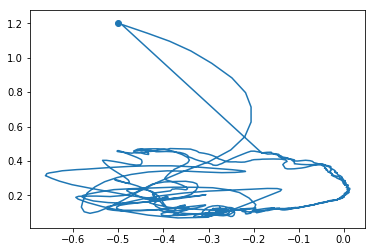




 49%|████▊     | 146/300 [5:13:25<5:37:56, 131.67s/it]

epoch #145	mean reward = -539.482	epsilon = 0.115


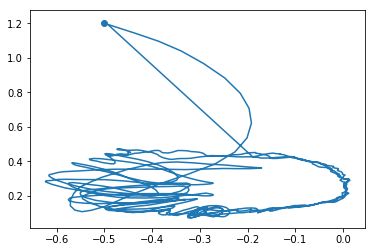

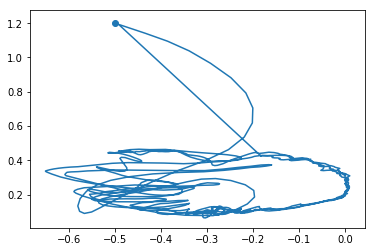

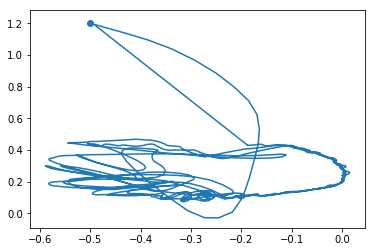




 49%|████▉     | 147/300 [5:15:36<5:35:25, 131.54s/it]

epoch #146	mean reward = -531.184	epsilon = 0.114


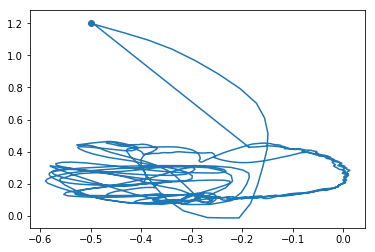

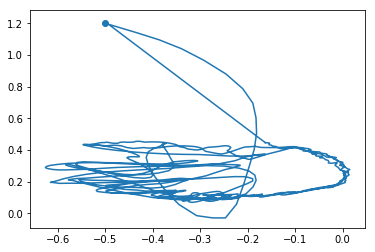

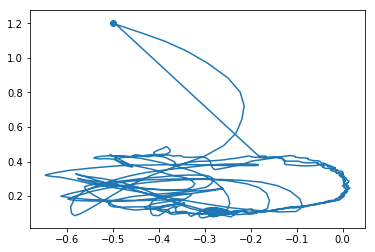




 49%|████▉     | 148/300 [5:17:49<5:34:30, 132.04s/it]

epoch #147	mean reward = -535.257	epsilon = 0.113


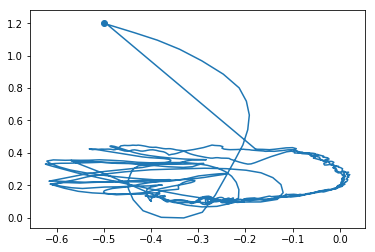

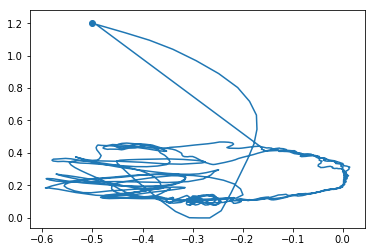

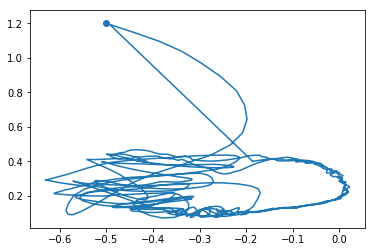




 50%|████▉     | 149/300 [5:20:03<5:33:53, 132.67s/it]

epoch #148	mean reward = -534.298	epsilon = 0.112


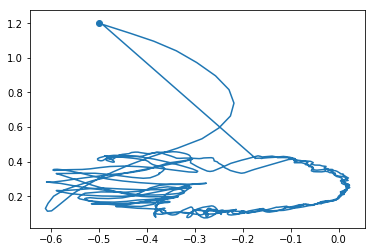

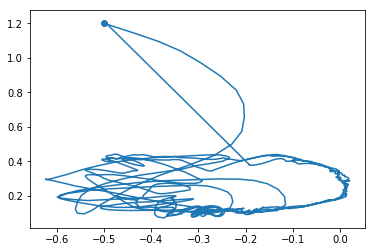

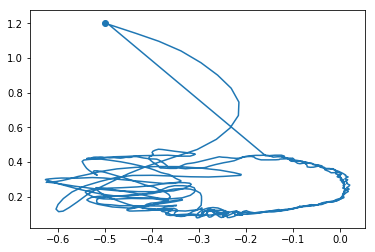




 50%|█████     | 150/300 [5:22:12<5:29:11, 131.68s/it]

epoch #149	mean reward = -531.328	epsilon = 0.111


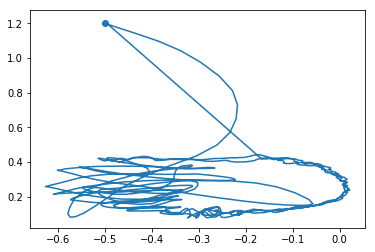

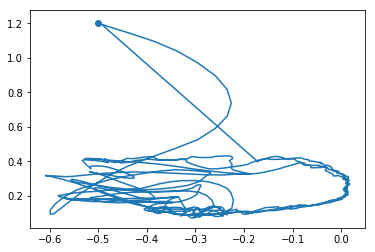

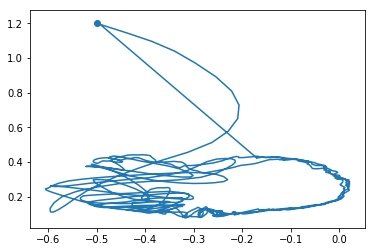




 50%|█████     | 151/300 [5:24:25<5:27:55, 132.05s/it]

epoch #150	mean reward = -535.156	epsilon = 0.110


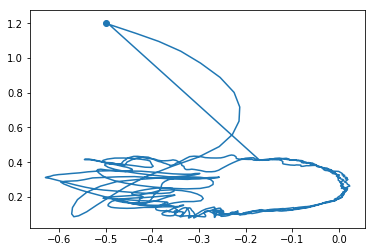

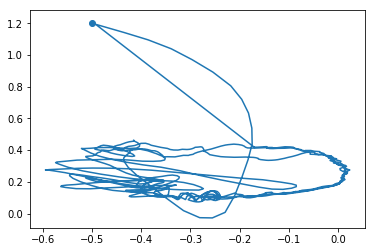

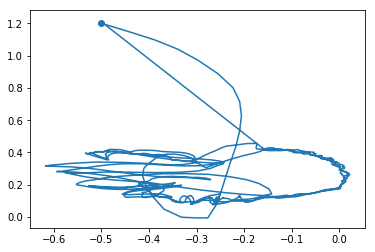




 51%|█████     | 152/300 [5:26:36<5:24:57, 131.74s/it]

epoch #151	mean reward = -534.117	epsilon = 0.109


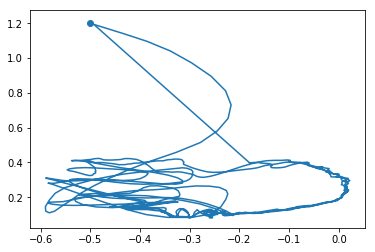

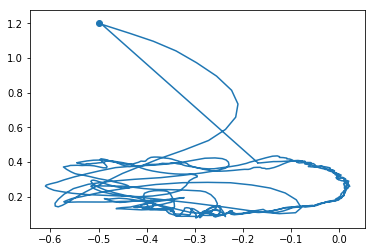

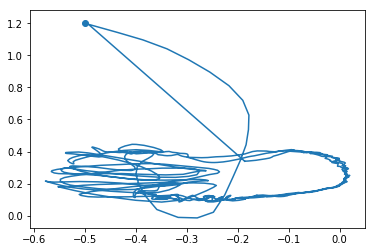




 51%|█████     | 153/300 [5:28:49<5:23:03, 131.86s/it]

epoch #152	mean reward = -540.870	epsilon = 0.107


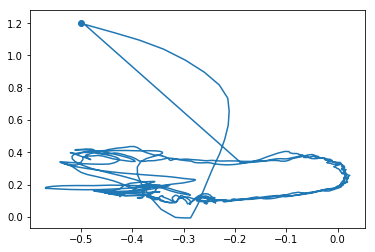

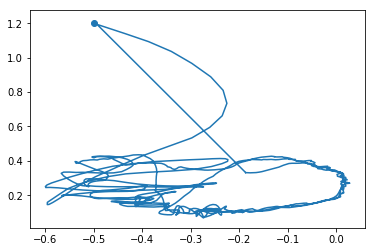

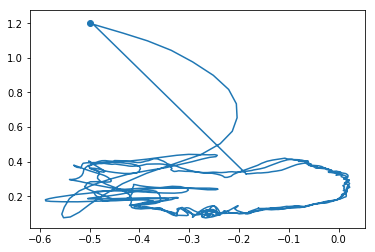




 51%|█████▏    | 154/300 [5:30:56<5:17:30, 130.48s/it]

epoch #153	mean reward = -544.109	epsilon = 0.106


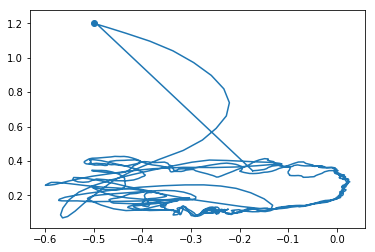

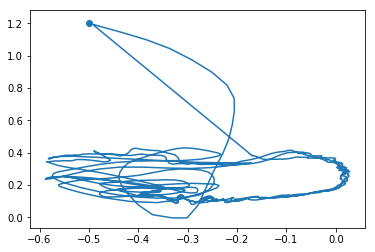

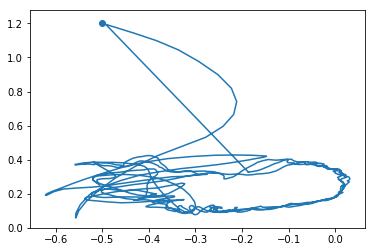




 52%|█████▏    | 155/300 [5:33:06<5:15:01, 130.35s/it]

epoch #154	mean reward = -544.827	epsilon = 0.105


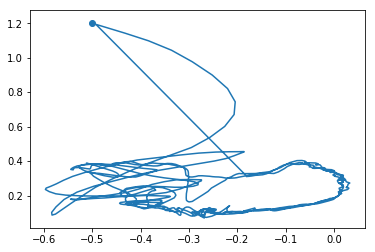

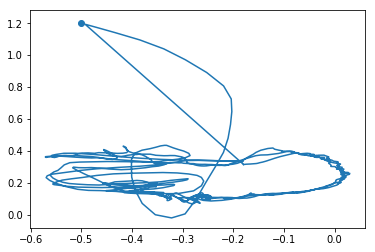

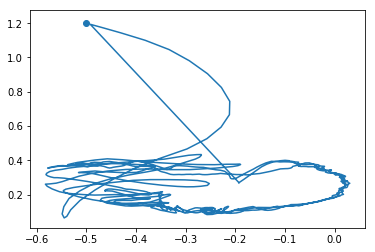




 52%|█████▏    | 156/300 [5:35:15<5:12:05, 130.04s/it]

epoch #155	mean reward = -545.623	epsilon = 0.104


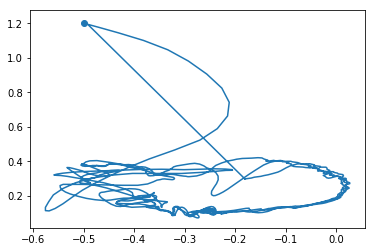

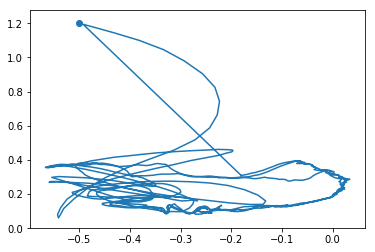

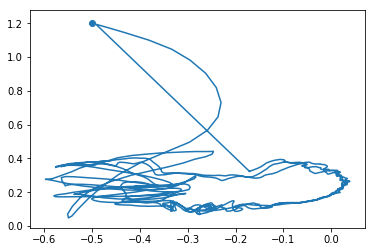




 52%|█████▏    | 157/300 [5:37:27<5:11:02, 130.50s/it]

epoch #156	mean reward = -553.936	epsilon = 0.103


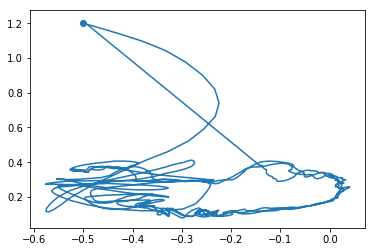

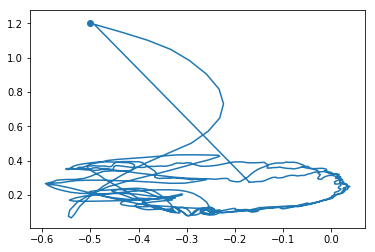

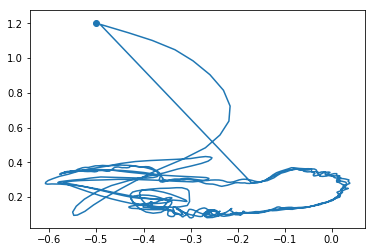




 53%|█████▎    | 158/300 [5:39:39<5:10:01, 131.00s/it]

epoch #157	mean reward = -554.517	epsilon = 0.102


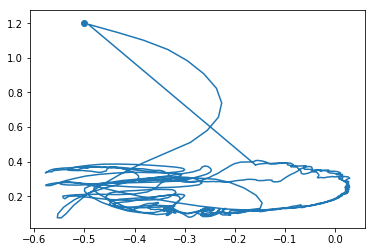

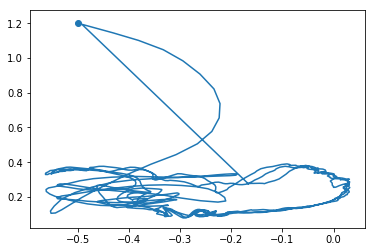

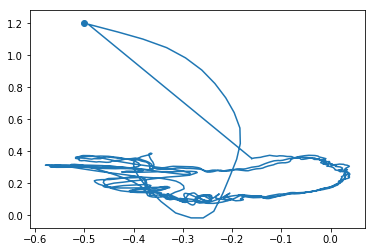




 53%|█████▎    | 159/300 [5:41:51<5:08:33, 131.30s/it]

epoch #158	mean reward = -558.403	epsilon = 0.101


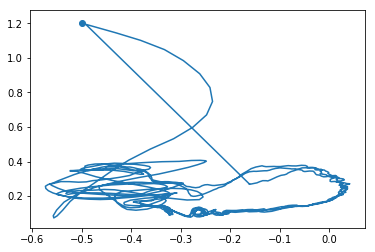

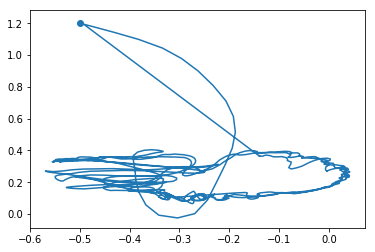

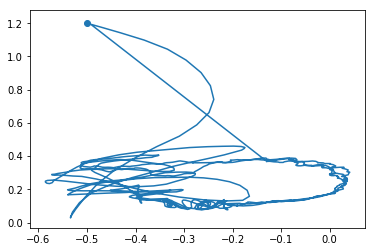




 53%|█████▎    | 160/300 [5:44:05<5:08:05, 132.04s/it]

epoch #159	mean reward = -550.191	epsilon = 0.100


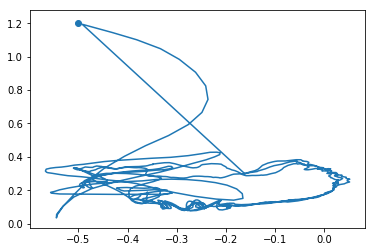

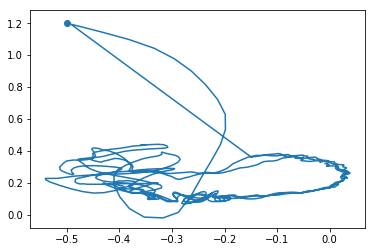

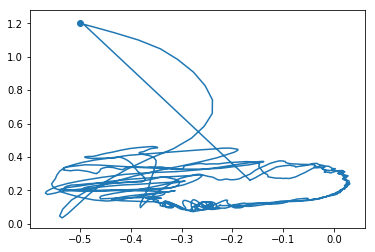




 54%|█████▎    | 161/300 [5:46:18<5:06:53, 132.47s/it]

epoch #160	mean reward = -553.734	epsilon = 0.099


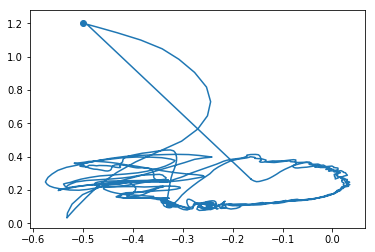

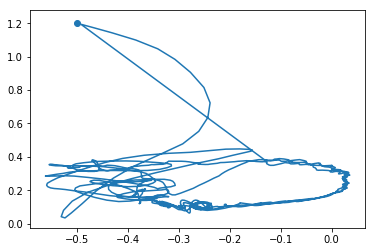

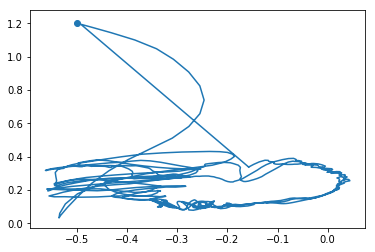




 54%|█████▍    | 162/300 [5:48:27<5:02:08, 131.36s/it]

epoch #161	mean reward = -553.059	epsilon = 0.098


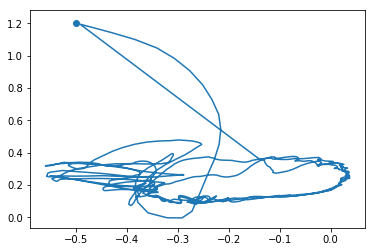

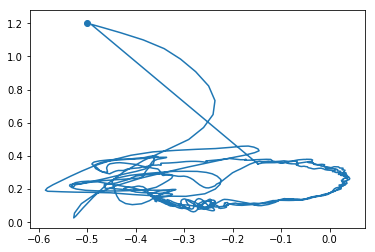

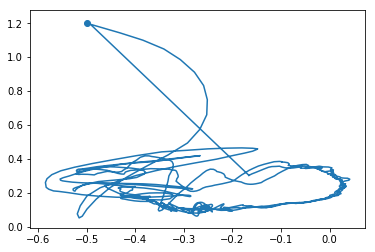




 54%|█████▍    | 163/300 [5:50:36<4:58:30, 130.73s/it]

epoch #162	mean reward = -556.492	epsilon = 0.097


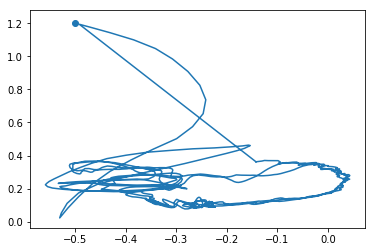

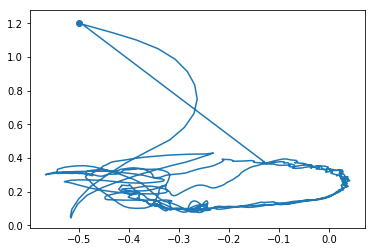

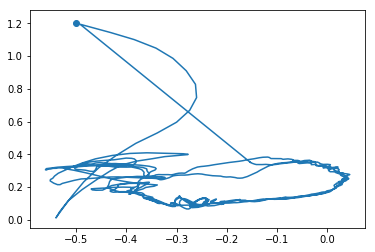




 55%|█████▍    | 164/300 [5:52:45<4:55:12, 130.24s/it]

epoch #163	mean reward = -561.628	epsilon = 0.096


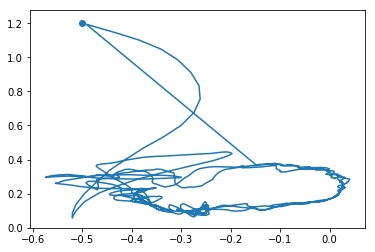

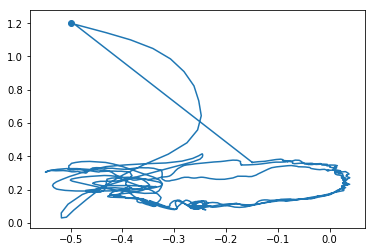

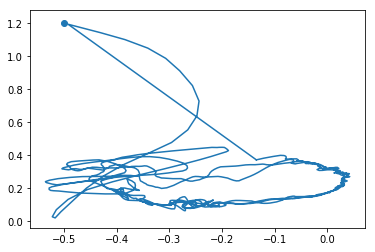




 55%|█████▌    | 165/300 [5:54:57<4:54:07, 130.73s/it]

epoch #164	mean reward = -561.366	epsilon = 0.095


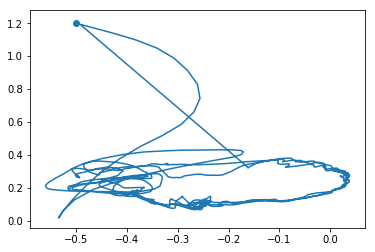

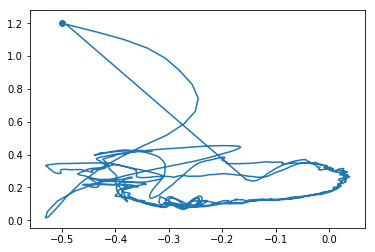

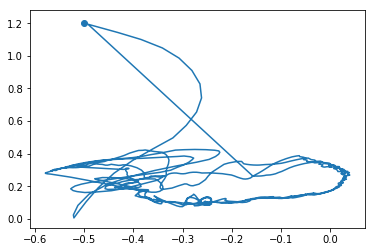




 55%|█████▌    | 166/300 [5:57:04<4:49:14, 129.51s/it]

epoch #165	mean reward = -558.098	epsilon = 0.094


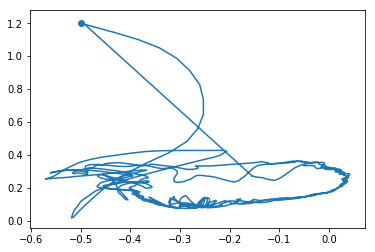

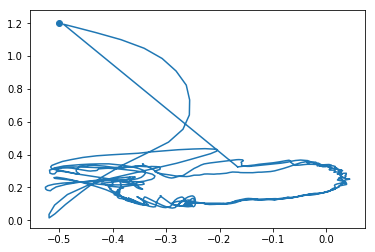

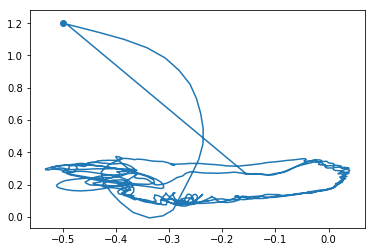




 56%|█████▌    | 167/300 [5:59:09<4:43:51, 128.06s/it]

epoch #166	mean reward = -564.698	epsilon = 0.093


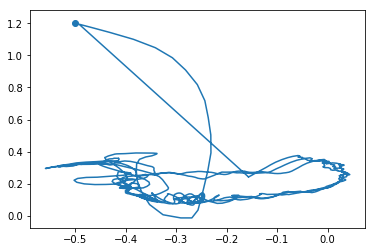

In [ ]:
out_file = open('out_file.txt', 'w')
n_epochs = 300
for i in tqdm(range(n_epochs)):
    session_rewards = [generate_session(
        epsilon=epsilon, train=True) for _ in range(3)]
    print("epoch #{}\tmean reward = {:.3f}\tepsilon = {:.3f}".format(
        i, np.mean(session_rewards), epsilon))
    out_file.write("epoch #{}\tmean reward = {:.3f}\tepsilon = {:.3f} \n".format(
        i, np.mean(session_rewards), epsilon))

    epsilon *= 0.99
    assert epsilon >= 1e-4, "Make sure epsilon is always nonzero during training"

    if np.mean(session_rewards) > 10:
        print("You Win!")
        break

In [ ]:
## yid = np.array([circle(t) for t in np.linspace(0, Time, DotQuan+1)])

[T, y_pre, _] = ode4(motionL,tm,y0,DotQuan,circle, deep_control, {"model": network});
plt.figure(figsize = (10, 10))

plt.plot(y_pre[:,0], y_pre[:,1])
plt.plot(yid[:, 0], yid[:, 1])
# plt.xlim((-0.82, 0.82))
# plt.ylim((0, 1.61))
plt.show()
